# CE310 Spring 2020/21: Genetic Programming and Symbolic Regression
## Assignment: Programming Assignment and mini project Part 2 (of 2) – Mini project

# Rachel Lowe, 1804170



# Some things to point out first

The provided code has been rewritten into a reusable object-oriented test harness, allowing tests for different functions to be run for a variety of parameters, testing 10 30-generation iterations for every permutation of:
* Population
    * 2000
    * 500
* Tournament size
    * 2
    * 5
* Crossover rate
    * 0.3
    * 0.7
* Mutation rate
    * 0.3
    * 0.7

The first few cells of this notebook contain the code for this test harness, and the tests using this harness (as well as the written up results) are below them. Most of the information about the harness itself are present as comments within the code for it.

If you just want the summary (in 498 words), just go to the 'conclusions' at the bottom of the report.

In [1]:
# Import relevant Python modules
import operator
import math
import random
import numpy  as np
from matplotlib import pyplot
from matplotlib import axes

from statistics import median

from statistics import mean

import typing

from typing import List, Tuple, Callable, Dict, Any, Union


from scipy import stats


from inspect import getsource

# Import DEAP modules
from deap import algorithms
from deap import base
from deap import creator
from deap import tools
from deap import gp

import faulthandler


faulthandler.enable()

In [2]:
UseSqError = True # use Least Squares approach

memorySaving = True # set this to true if you want to yeet the tests/psets from the global scope after they're done.
# this is mainly intended for memory saving purposes.


In [3]:
# the protectedDiv function from earlier. returns 1 if trying to divide by 0
def protectedDiv(left, right):
    return left / right if right else 1

# the rand101 lambda from the given pset except it's not a lambda
def rand101() -> int:
    return random.randint(-1,1)

# a protectedSqrt function. returns 1 if trying to find a square root of a negative number
def protectedSqrt(x: float) -> float:
    if x < 0:
        return 1
    else:
        return math.sqrt(x)


In [4]:
# this is here mostly because of an ePhEmErAlS nEeD dIfFeReNt NaMeS eVeN iN dIfFeReNt PsEtS
# but then it still didn't work properly but im keeping this here just in case
uniqueNameSuffixCounter = 0

def appendUniqueNameSuffix(appendToThis: str) -> str:
    global uniqueNameSuffixCounter
    theSuffix = str(uniqueNameSuffixCounter)
    theName = appendToThis + "_" + theSuffix
    uniqueNameSuffixCounter += 1
    return theName


# this is the same as the already given primitive set.
# it's here as a fallback just in case something goes wrong and the user doesn't give a primitive set.
# it takes 1 argument and it renames that argument x
if "pset" not in globals():
    pset = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN"),1)
    pset.addPrimitive(operator.add, 2)
    pset.addPrimitive(operator.sub, 2)
    pset.addPrimitive(operator.mul, 2)
    pset.addPrimitive(protectedDiv, 2)
    pset.addPrimitive(operator.neg, 1)
    pset.addPrimitive(math.cos, 1)
    pset.addPrimitive(math.sin, 1)
    # numerical constants +-1
    pset.addTerminal(1)
    pset.addTerminal(-1)
    # also allowing the GP to use randomness
    pset.addEphemeralConstant(appendUniqueNameSuffix("rand101"), rand101)
    pset.renameArguments(ARG0='x')

# and here's the other stats stuff that was included in the given sample code
stats_fit = tools.Statistics(lambda ind: ind.fitness.values)
stats_size = tools.Statistics(len)
mstats = tools.MultiStatistics(fitness=stats_fit, size=stats_size)
mstats.register("mdn", np.median)
mstats.register("avg", np.mean)
mstats.register("std", np.std)
mstats.register("min", np.min)
mstats.register("max", np.max)

creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", gp.PrimitiveTree, fitness=creator.FitnessMin)

In [5]:
# this class basically holds the info about the populations from a given configuration of parameters.

class PopInfo:
    """
     this class basically holds the info about the populations from a given
     configuration of parameters.
    """
    def __init__(self, label: str, popSize: int, tourn: int, pXO: float, pMut: float, maximization: bool = False):
        """
        constructs this object
        :label: string for labelling the graphs later on
        :popSize: size of the population for this config
        :tourn: tournament size for config
        :pXO: crossover chance for config
        :pMut: mutation rate for config
        :maximization: whether or not this is a maximization problem. true if it is.
        """
        self.pop: int = popSize
        self.tourn: int = tourn
        self.p_xo: float = pXO
        self.p_m: float = pMut
        self.logs: List[tools.Logbook] = [] # logs for each iteration of the config
        self.hofIndividuals = [] # the hall-of-fame individiuals for each iteration of the config
        self.fitnesses: List[float] = [] # fitnesses of aforementioned individuals
        self.fittestCursor: int = 0 # cursor pointing to index of fittest
        self.iterationCount: int = 0 # how many iterations have been done
        self.label = label # the string with the config info
        self.fittestFitness: float = 0 # how fit the fittest fitness is
        self.maximization = maximization # whether this is trying to maximize or minimize that fitness
        self.evaluations = 0 # how many evaluations have been done
        self.compiledFunctions = [] # a list of all the compiled fittests
        self.fittestCompiled = lambda x: x
        # this function basically adds the logbook and hall of fame individual from an iteration to the results
    def addTestResults(self, log: tools.Logbook, hallOfFame: tools.HallOfFame, compiledHOF) -> None:
        """
        adds the results from an iteration to the info recorded here
        :param log: the logbook from the iteration
        :param hallOfFame: the HallOfFame from the iteration
        :param compiledHOF: the compiled version of the individual in that HallOfFame
        :return: nothing
        """
        newIndividual = hallOfFame[0]
        newFitness = newIndividual.fitness.values[0]
        # also updates what the fittest result so far is if necessary
        if self.iterationCount > 0:
            if self.maximization:
                if self.fittestFitness < newFitness: #if it's a maximization problem, we get the smallest fitness
                    self.fittestCursor = self.iterationCount
                    self.fittestFitness = newFitness
                    self.fittestCompiled = compiledHOF
            elif self.fittestFitness > newFitness: #if it's a minimization problem, we get the largest fitness
                self.fittestCursor = self.iterationCount
                self.fittestFitness = newFitness
                self.fittestCompiled = compiledHOF
        else:
            self.fittestFitness = newFitness
            self.fittestCompiled = compiledHOF
            self.fittestCursor = 0
        self.iterationCount += 1
        self.logs.append(log)
        self.hofIndividuals.append(newIndividual)
        self.fitnesses.append(newFitness)
        self.compiledFunctions.append(compiledHOF)
        self.evaluations += sum(log.select("nevals")) # adds the count of evaluations to the current count of evaluations
    def getLabel(self) -> str:
        """
        :return: returns the label indicating what config this is
        """
        return self.label
    def getFittestFitness(self) -> float:
        """
        :return: returns the fittest fitness value
        """
        return self.fittestFitness
    def getMeanFitness(self) -> float:
        """
        :return: returns the mean of all the fitness values
        """
        return mean(self.fitnesses)
    def getMedianFitness(self) -> float:
        """
        :return: returns the median of all the fitness values
        """
        return median(self.fitnesses)
    def getAverageFitness(self) -> float:
        """
        :return: returns the mean of (the best fitness, mean fitness, median fitness)
        """
        return mean([self.fittestFitness, self.getMeanFitness(), self.getMedianFitness()])
    def getFittest(self):
        """
        :return: returns the fittest individual
        """
        return self.hofIndividuals[self.fittestCursor]
    def fittestResults(self):
        """
        :return: tuple with the logs and the hallOfFame individual for fittest iteration
        """
        return self.logs[self.fittestCursor], self.hofIndividuals[self.fittestCursor]
    def getAllResults(self):
        """
        :return: list of tuples (hall of fame individuals, logs) for each iteration 
        """
        results = []
        for i in range(0, self.iterationCount):
            results.append((self.hofIndividuals[i], self.logs[i]))
        return results
    def getNormalizedFitnessVsSizeResults(self):
        """
        :return: a list of tuples with normalized fitnesses and sizes
        """
        res = []
        maxFit = max(max(l.chapters['fitness'].select("mdn")) for l in self.logs)
        maxSize = max(max(l.chapters['size'].select("mdn")) for l in self.logs)

        for i in range(0, self.iterationCount):
            l = self.logs[i]
            fits = l.chapters['fitness'].select("mdn")
            sizes = l.chapters['size'].select("mdn")
            normFits = [(f/maxFit) for f in fits]
            normSizes = [(s/maxSize) for s in sizes]
            res.append((normFits, normSizes))
        return res
    def getAvgFitnessAndSize(self):
        """
        :return: a tuple with the aggregate average fitness and average size for all iterations.
        """
        avgFits = 0
        avgSizes = 0
        for i in range(0, self.iterationCount):
            l = self.logs[i]
            avgFits += l.chapters['fitness'].select('avg')[-1]
            avgSizes += l.chapters['size'].select('avg')[-1]
        
        return avgFits/self.iterationCount, avgSizes/self.iterationCount


# this is used instead of a lambda method when we need to sort popInfo objects by their fittest fitness.
def sortByFitness(popInfo : PopInfo) -> float:
    return popInfo.fittestFitness



In [6]:
# given a method taking a float in and returning a float,
# a boundary of points, an offset for that boundary, and a number of points,
# this method basically plots the points for that method.

def generateTestPointsAndTarget(measurement: Callable[[float], float],
                                limit: float = math.pi, offset: float = 0, count: int = 65):
    """
    
    :param measurement: method taking a float in and returning a float to be plotted
    :param limit: upper/lower bound for the points (defaults to pi)
    :param offset: offset for the boundary (defaults to 0)
    :param count: number of points to plot (defaults to 65)
    :return: tuple with an array of x points in the given range, and another array for the y values of the x points put through the given function
    """
    lowerBound = offset - limit
    upperBound = offset + limit
    testPoints = np.linspace(lowerBound, upperBound, count).tolist()
    target = np.empty(len(testPoints))
    for i in range(len(testPoints)): target[i] = measurement(testPoints[i])
    return testPoints, target




In [7]:
# This class basically tests a single configuration of parameters for a run.

class ConfigTester:
    """
    A class that basically handles running the GP stuff with a particular configuration
    of parameters.
    """
    def __init__(self, genCount: int, popSize: int, tourn: int, pXO: float, pMut: float,
                 measure: Callable[[float], float], testPoints, target, iterations: int,
                 pset: gp.PrimitiveSet, maximization: bool = False):
        """
        This constructs this object
        :param genCount: total number of generations to use
        :param popSize: size of population
        :param tourn: tournament size
        :param pXO: crossover rate
        :param pMut: mutation rate
        :param measure: method that is being tested
        :param testPoints: points on the x axis that will be put through the measure function
        :param target: points on the y axis that are the results of putting testPoints through the measure
        :param iterations: how many iterations to use
        :param pset: the primitive set to use
        :param maximization: whether this is a maximization of problem
        """
        self.no_generations = genCount
        self.no_population = popSize
        self.no_tournaments = tourn
        self.p_xo = pXO
        self.p_m = pMut
        self.measurement = measure

        self.test_points = testPoints
        self.target = target
        self.toolbox = base.Toolbox()

        self.pset = pset
        self.maximization = maximization

        self.iterations = iterations
        self.theLabel = "pop: " + str(self.no_population) + \
                        ", tourn: " + str(self.no_tournaments) + \
                        ", xo: " + str(self.p_xo) +\
                        ", mut: " + str(self.p_m)
        
        self.popInfo = PopInfo(self.theLabel, self.no_population, self.no_tournaments, self.p_xo, self.p_m, self.maximization)

    # basically the function that calculates the fitness function for a given individual
    def evalSymbReg(self, individual):

        # Transform the tree expression in a callable function
        func = self.toolbox.compile(expr=individual)

        if UseSqError:
            # squared error
            error = (abs(func(x) - self.measurement(x))**2 for x in self.test_points)
        else:
            # Absolute distance between target curve and solution
            error = (abs(func(x) - self.measurement(x)) for x in self.test_points)

        return math.fsum(error)/len(self.test_points),

    # runs the genetic programming stuff
    def runTheGP(self) -> None:
        """
        sets up and runs the GP, logging stuff in the popInfo object of this object
        :return: nothing
        """
        # sets up the GP stuff
        self.toolbox.register("expr", gp.genHalfAndHalf, pset=self.pset, min_=1, max_=2)
        self.toolbox.register("individual", tools.initIterate, creator.Individual, self.toolbox.expr)
        self.toolbox.register("population", tools.initRepeat, list, self.toolbox.individual)
        self.toolbox.register("compile", gp.compile, pset=self.pset)

        self.toolbox.register("evaluate", self.evalSymbReg)
        self.toolbox.register("select", tools.selTournament, tournsize=self.no_tournaments)
        self.toolbox.register("mate", gp.cxOnePoint)
        self.toolbox.register("expr_mut", gp.genFull, min_=0, max_=2)
        self.toolbox.register("mutate", gp.mutUniform, expr=self.toolbox.expr_mut, pset=self.pset)

        self.toolbox.decorate("mate", gp.staticLimit(key=operator.attrgetter("height"), max_value=64))
        self.toolbox.decorate("mutate", gp.staticLimit(key=operator.attrgetter("height"), max_value=64))

        random.seed()

        # does the GP stuff for as many iterations as it needs to do, logging the results in the popInfo object.
        for i in range(0, self.iterations):
            print("Starting iteration",str(i))
            pop = self.toolbox.population(n=self.no_population)
            hof = tools.HallOfFame(1)


            # verbose is false, because, if it was set to true, we'd be pretty much out of memory
            pop, log = algorithms.eaSimple(pop, self.toolbox, self.p_xo, self.p_m, self.no_generations,
                                           stats=mstats, halloffame=hof, verbose=False)
            print("Iteration",str(i),"done,",str(sum(log.select("nevals"))),"evaluations.")
            print("\t",hof[0])
            print("\t",hof[0].fitness.values[0])
            self.popInfo.addTestResults(log, hof, self.toolbox.compile(expr = hof[0]))





In [8]:

"""
These are all the hyper-parameters we will be testing
"""
generations: int = 30 # we're using 30 generations

all_populations: List[int] = [500, 2000]
all_tournaments: List[int]  = [2, 5]
all_xo: List[float]  = [0.7, 0.3]
all_m: List[float] = [0.3, 0.7]
    
"""
And these are some dictionaries to hold info about the fitnesses
for every single run with each particular value for these hyper-parameters
"""

allPopFitnesses: Dict[int, List[float]] = {}
#allPopSizes: Dict[int, List[float]] = {}
for p in all_populations:
    allPopFitnesses[p] = []
#    allPopSizes[p] = []
allTournFitnesses: Dict[int, List[float]] = {}
#allTournSizes: Dict[int, List[float]] = {}
for t in all_tournaments:
    allTournFitnesses[t] = []
#    allTournSizes[t] = []
allXoFitnesses: Dict[float, List[float]] = {}
#allXoSizes: Dict[float, List[float]] = {}
for x in all_xo:
    allXoFitnesses[x] = []
#    allXoSizes[x] = []
allMutFitnesses : Dict[float, List[float]] = {}
#allMutSizes: Dict[float, List[float]] = {}
for m in all_m:
    allMutFitnesses[m] = []
#    allMutSizes[m] = []
    
# basically the headers for each of the tests in the dictionary.
# these are held in the same order that the tests will be put in the
# dictionaries, as they will follow the same overall iterations basically
popHeaders: List[str] = []
tournHeaders: List[str] = []
xoHeaders: List[str] = []
mutHeaders: List[str]  = []
    
# putting in population headers in the right order
for t in all_tournaments:
    tString = ("tourn " + str(t)).ljust(8)
    for x in all_xo:
        xString = ("xo: " + str(x)).ljust(8)
        for m in all_m:
            mString = ("mut: " + str(m)).ljust(8)
            popHeaders.append(tString + " " + xString + " " + mString)

# putting in tournament size headers in the right order
for p in all_populations:
    pString = ("pop " + str(p)).ljust(8)
    for x in all_xo:
        xString = ("xo: " + str(x)).ljust(8)
        for m in all_m:
            mString = ("mut: " + str(m)).ljust(8)
            tournHeaders.append(pString + " " + xString + " " + mString)

# putting in crossover rate headers in the right order            
for p in all_populations:
    pString = ("pop " + str(p)).ljust(8)
    for t in all_tournaments:
        tString = ("tourn " + str(t)).ljust(8)
        for m in all_m:
            mString = ("mut: " + str(m)).ljust(8)
            xoHeaders.append(pString + " " + tString + " " + mString)

# putting in mutation rate headers in the right order
for p in all_populations:
    pString = ("pop " + str(p)).ljust(8)
    for t in all_tournaments:
        tString = ("tourn " + str(t)).ljust(8)
        for x in all_xo:
            xString = ("xo: " + str(x)).ljust(8)
            mutHeaders.append(pString + " " + tString + " " + xString)

# set this to true if any tests are going to be performed which are stupid and will pollute the results for all params etc
stupidityAlert: bool = False

class ParameterTester:
    """
    basically runs a given genetic programming problem for various configurations of parameters,
    and also produces graphs and such for it
    """
    def __init__(self, measurementToUse: Callable[[float], float], primSet: gp.PrimitiveSet = pset,
                 maximization: bool = False, iterations: int = 10, xLimit: float = math.pi,
                 xOffset :float = 0, xCount : int = 65):
        """
        This constructs this object
        :param measurementToUse: f(x)->y method being symbolic regression'd
        :param primSet: primitive set to use
        :param maximization: whether this is a maximization of problem or not
        :param iterations: how many iterations to use for each config
        :param xLimit: x bounds for generateTestPointsAndTarget
        :param xOffset: offset for generateTestPointsAndTarget
        :param xCount: count for generateTestPointsAndTarget
        """

        self.measure = measurementToUse

        self.maximization = maximization

        self.stringMeasure = getsource(measurementToUse)

        print("Testing: ")
        print(self.stringMeasure)

        self.iterations = iterations
        (self.test_points, self.target) = generateTestPointsAndTarget(self.measure, xLimit, xOffset, xCount)

        self.targetFig, ax0 = pyplot.subplots(nrows = 1, ncols = 1, figsize = (16, 9))
        ax0.plot(self.test_points, self.target, linestyle = "solid", alpha = 0.5)
        ax0.scatter(self.test_points, self.target, label = self.stringMeasure)
        ax0.set_xlabel('Test points')
        ax0.set_ylabel('Measurements')
        ax0.set_title('Data set')
        ax0.grid(b=True, which='major', color='#666666', linestyle='-', axis = "y")
        ax0.grid(b=True, which='minor', color='#999999', linestyle='-', axis = "y", alpha=0.2)
        ax0.legend()
        self.targetFig.show()

        self.fitSizeFig, self.fitSizePlots = pyplot.subplots(nrows = 4, ncols = 4, figsize = (48, 27),
                                                             sharex = "all", sharey = "all")
        self.fitSizeFig.suptitle("Error of result vs result size")



        self.resTargetFig, self.resTargetPlots = pyplot.subplots(nrows = 4, ncols = 4, figsize = (48,27),
                                                                 sharex = "all", sharey = "all")
        self.resTargetFig.suptitle("Result(s) compared to target")



        self.allResults : List[PopInfo] = []

        self.pset = primSet
        
        self.popFitnesses: Dict[int, List[float]] = {}
        #self.popSizes: Dict[int, List[float]] = {}
        for p in all_populations:
            self.popFitnesses[p] = []
            #self.popSizes[p] = []
        self.tournFitnesses: Dict[int, List[float]] = {}
        #self.tournSizes: Dict[int, List[float]] = {}
        for t in all_tournaments:
            self.tournFitnesses[t] = []
            #self.tournSizes[t] = []
        self.xoFitnesses: Dict[float, List[float]] = {}
        #self.xoSizes: Dict[float, List[float]] = {}
        for x in all_xo:
            self.xoFitnesses[x] = []
            #self.xoSizes[x] = []
        self.mutFitnesses : Dict[float, List[float]] = {}
        #self.mutSizes: Dict[float, List[float]] = {}
        for m in all_m:
            self.mutFitnesses[m] = []
            #self.mutSizes[m] = []

    # runs the GP for every single configuration of parameters
    def runTheTests(self) -> None:
        """
        runs the GP for every single configuration of parameters
        :return: nothing.
        """

        global allPopFitnesses
        global allTournFitnesses
        global allMutFitnesses
        global allXoFitnesses

        xCount = 0
        yCount = 0
        for pop in all_populations:
            for tour in all_tournaments:
                for xo in all_xo:
                    for mut in all_m:

                        print("x" + str(xCount)+", y" + str(yCount))

                        test = ConfigTester(generations,pop, tour, xo, mut,
                                               self.measure, self.test_points, self.target,
                                               self.iterations, self.pset, self.maximization)
                        print(test.theLabel)
                        test.runTheGP()
                        print("done")
                        self.allResults.append(test.popInfo)

                        self.__plotResults(test.popInfo,
                                           self.fitSizePlots[xCount][yCount],
                                           self.resTargetPlots[xCount][yCount])
                        
                        best = test.popInfo.fittestFitness
                            
                            
                        self.popFitnesses[pop].append(best)
                        self.tournFitnesses[tour].append(best)
                        self.xoFitnesses[xo].append(best)
                        self.mutFitnesses[mut].append(best)
                        
                        #self.popSizes[pop].append(sizes)
                        #self.tournSizes[tour].append(sizes)
                        #self.xoSizes[xo].append(sizes)
                        #self.mutSizes[mut].append(sizes)
                        
                        if not stupidityAlert:
                            allPopFitnesses[pop].append(best)
                            allTournFitnesses[tour].append(best)
                            allXoFitnesses[xo].append(best)
                            allMutFitnesses[mut].append(best)
                            
                            #allPopSizes[pop].append(sizes)
                            #allTournSizes[tour].append(sizes)
                            #allXoSizes[xo].append(sizes)
                            #allMutSizes[mut].append(sizes)

                        yCount += 1
                yCount = 0
                xCount += 1

    # shows the results of the runs after they're done running
    def showResults(self) -> None:
        """
        shows the results of the runs after they're done running
        :return: nothing.
        """
        self.fitSizeFig.show()

        self.resTargetFig.show()

        bestOverallPop = sorted(self.allResults, key = lambda info: info.fittestFitness, reverse= self.maximization)
        bestMeanPop = sorted(self.allResults, key = lambda info: info.getMeanFitness(), reverse= self.maximization)
        bestMedianPop = sorted(self.allResults, key = lambda info: info.getMedianFitness(), reverse= self.maximization)

        bestAvgPop = sorted(self.allResults, key = lambda info: info.getAverageFitness(), reverse= self.maximization)

        evaluationPop = sorted(self.allResults, key = lambda info: info.evaluations)

        theBest = bestOverallPop[0]
        meanBest = bestMeanPop[0]
        medianBest = bestMedianPop[0]

        avgBest = bestAvgPop[0]

        evalBest = evaluationPop[0]

        print("")
        print("")
        print("The best overall result, with an error of", str(theBest.fittestFitness), "was:")
        print(theBest.getFittest())
        print(theBest.label)

        print("\n--")
        print("full overall rankings:")
        for p in bestOverallPop:
            print("\t", p.label)
            print("\t\t", p.fittestFitness)
            print("\t\t", p.getFittest())
            print("---")

        print("")
        print("")
        print("The mean best configuration with a mean fitness of", str(meanBest.getMeanFitness()),"was:")
        print(meanBest.label)

        print("\n--")
        print("full mean rankings:")
        for p in bestMeanPop:
            print("\t", p.label)
            print("\t\t", p.getMeanFitness())
            print("---")

        print("")
        print("")
        print("The median best configuration with a median fitness of",str(medianBest.getMedianFitness()),"was:")
        print(medianBest.label)
        print("\n--")
        print("full median rankings:")
        for p in bestMedianPop:
            print("\t", p.label)
            print("\t\t", p.getMedianFitness())
            print("---")

        print("")
        print("")
        print("And, from the mean of the mean, median, and best fitnesses, the best result is",
              str(avgBest.getAverageFitness()))
        print(avgBest.label)
        print("\n--")
        print("full avg rankings:")
        for p in bestAvgPop:
            print("\t", p.label)
            print("\t\t", p.getAverageFitness())
            print("---")


        print("")
        print("")
        print("And the one with the fewest evaluations, with",str(evalBest.evaluations),"was")
        print(evalBest.label)

        print("\n--")
        print("full evaluation count rankings:")
        for p in evaluationPop:
            print("\t", p.label)
            print("\t\t", p.evaluations)
            print("---")

        print("----")


    def statPrinter(self) -> None:
        """
        prints the pairs of fitness stats for each configuration for each parameter
        idk how to best put it into words but like if we're testing pop 500 vs pop2000,
        it'll print the pop500 and pop2000 fitnesses for a given tourn T, crossover XO, and mut M
        so you can like compare the 500 vs 2000 stuff a bit easier
        
        but like for every pair of stats
        
        :return: nothing
        """

        print("Stats for this run")
        
        print("")
        
        print("Best fitnesses with each parameter config")
        print("")
        for h in range(0, 8):
            print(popHeaders[h] + ":")
            print("\t 500 : " + str(self.popFitnesses[500][h]))
            #print("\t     s: " + str(self.popSizes[500][h]))
            print("\t2000 : " + str(self.popFitnesses[2000][h]))
           # print("\t     s: " + str(self.popSizes[2000][h]))
        print("")
        
        
        print("tournament fitnesses with each parameter config")
        print("")
        for h in range(0, 8):
            print(tournHeaders[h] + ":")
            print("\t 2 : " + str(self.tournFitnesses[2][h]))
            #print("\t   s: " + str(self.tournSizes[2][h]))
            print("\t 5 : " + str(self.tournFitnesses[5][h]))
            #print("\t   s: " + str(self.tournSizes[5][h]))
        print("")
        
        print("crossover fitnesses with each parameter config")
        print("")
        for h in range(0, 8):
            print(xoHeaders[h] + ":")
            print("\t 0.7 : " + str(self.xoFitnesses[0.7][h]))
            #print("\t     s: " + str(self.xoSizes[0.7][h]))
            print("\t 0.3 : " + str(self.xoFitnesses[0.3][h]))
            #print("\t     s: " + str(self.xoSizes[0.3][h]))
        print("")
        
        
        print("mutation fitnesses with each parameter config")
        print("")
        for h in range(0, 8):
            print(mutHeaders[h] + ":")
            print("\t 0.3 f: " + str(self.mutFitnesses[0.3][h]))
            #print("\t     : " + str(self.mutSizes[0.3][h]))
            print("\t 0.7 f: " + str(self.mutFitnesses[0.7][h]))
            #print("\t     : " + str(self.mutSizes[0.7][h]))
        print("")
        
    def __ttester(self, values: Dict[Union[float, int], List[float]], valTitle: str, maxi: bool = False) -> None:
        """
        performs the T-test on the given dictionary of lists of floats
        :param values: dictionary with lists of values
        :param valTitle: name of the value we're testing
        :return: nothing
        """
        keyList: List[Union[float, int]] = [*values.keys()]

        p1: Union[float, int] = keyList[0]
        p2: Union[float, int] = keyList[1]

        tStat, pVal = stats.ttest_rel(values[p1],values[p2])

        # t = difference
        # p = significance

        best: Union[float,int] = p1
        
        # if t < 0:
        #     p1 < p2
        # if t > 0:
        #     p1 > p2
        
        if maxi:
            # if this is a maximization problem, p2 is best if t is negative (p2 bigger).
            if tStat < 0:
                best = p2
        elif tStat > 0:
            # if this is a minimization problem, p2 is best if t is positive (p1 bigger)
            best = p2

        print("The best " + valTitle + " is " + str(best))
        print("\tDifference: " + str(tStat))
        print("\tUncertainty: " + str(pVal))

        if pVal > 0.05: # less than 95% certainty
            print("This is not a significant difference. (<95%)")
        elif pVal >= 0.01: # 99-95% certainty
            print("This is a significant difference. (95%<=sig<=99%)")
        else: # 99% or better certainty
            print("This is a very significant difference. >99%")
        
    def statTester(self) -> None:
        """
        performs the T-test for all paired parameter config results,
        both for this particular test of them all, and for all that
        have ever happened so far.
        :return: nothing
        """
        
        print("T-test for all the paired parameter config results.")
        
        print("")
        print("Tests for this measure")
        print("")
        
        self.__ttester(self.popFitnesses,"population size", self.maximization)

        #print("")
        #self.__ttester(self.popSizes,"population size sizes", False)
        print("")
        self.__ttester(self.tournFitnesses,"tournament size", self.maximization)
        
        #print("")
        #self.__ttester(self.tournSizes,"tournament size sizes", False)

        print("")
        self.__ttester(self.xoFitnesses, "crossover rate", self.maximization)
        #print("")
        #self.__ttester(self.xoSizes, "crossover rate sizes", False)

        print("")
        self.__ttester(self.mutFitnesses, "mutation rate", self.maximization)
        #print("")
        #self.__ttester(self.mutSizes, "mutation rate sizes", False)

        print("")
        print("Stats for all runs so far")
        print("")

        print("")
        
        self.__ttester(allPopFitnesses,"population size", self.maximization)

        #print("")
        #self.__ttester(allPopSizes,"population size sizes", False)
        print("")
        self.__ttester(allTournFitnesses,"tournament size", self.maximization)
        
        #print("")
        #self.__ttester(allTournSizes,"tournament size sizes", False)

        print("")
        self.__ttester(allXoFitnesses, "crossover rate", self.maximization)
        #print("")
        #self.__ttester(allXoSizes, "crossover rate sizes", False)

        print("")
        self.__ttester(allMutFitnesses, "mutation rate", self.maximization)
        #print("")
        #self.__ttester(allMutSizes, "mutation rate sizes", False)



    # private method to plot the results of a run after every run
    def __plotResults(self, test: PopInfo, fitSizeAx: axes.Axes,
                      bestResultTargetAx: axes.Axes) -> None:
        """
        private method to plot the results of a run after every run
        :param test: popInfo object for this run
        :param fitSizeAx: fitness vs size axes to use
        :param bestResultTargetAx: axes to plot the result vs target stuff on
        :return: nothing
        """
        testLabel = test.getLabel()
        fitSizeAx.set_title(testLabel)

        fitSizeXValues = np.arange(0, generations + 1)

        fitSizeAx.set_ybound(0,1)
        fitSizeAx.grid(b=True, which='major', color='#666666', linestyle='-', axis = "both")
        fitSizeAx.grid(b=True, which='minor', color='#999999', linestyle='-', axis = "both", alpha=0.4)

        fitSizeAx.set_ylabel("Normalized error/size")
        fitSizeAx.set_xlabel("Generations")

        fitnessesAndSizes = test.getNormalizedFitnessVsSizeResults()

        for i in range(0, len(fitnessesAndSizes)):
            stringI = str(i)
            lin: List[pyplot.Line2D] = fitSizeAx.plot(fitSizeXValues, fitnessesAndSizes[i][0],
                                                      label = "Error (" + stringI + ")")
            colour = lin[0].get_color() # both lines same colour.
            fitSizeAx.plot(fitSizeXValues, fitnessesAndSizes[i][1], label = "Size (" + stringI + ")",
                           dashes=[6, 2], color = colour)

        fitSizeAx.legend()

        bestResultTargetAx.set_title(testLabel)
        bestResultTargetAx.grid(b=True, which='major', color='#666666', linestyle='-', axis = "both")
        bestResultTargetAx.grid(b=True, which='minor', color='#999999', linestyle='-', axis = "both", alpha=0.4)

        bestResultTargetAx.set_xbound(lower = min(self.test_points), upper = max(self.test_points))
        bestResultTargetAx.set_ylabel("f(x)")
        bestResultTargetAx.set_xlabel("x values")

        bestResultTargetAx.plot(self.test_points, self.target, color = "#000000", label = "Target")
        pointCount = len(self.test_points)

        print(test.getFittest())
        print(test.getFittestFitness())

        for f in test.compiledFunctions:
            y = np.empty(pointCount)
            for i in range(pointCount): y[i] = f(self.test_points[i])
            bestResultTargetAx.plot(self.test_points, y, linestyle ="dashed", alpha = 0.5, linewidth = 0.9)

        y = np.empty(pointCount)
        for i in range(pointCount): y[i] = test.fittestCompiled(self.test_points[i])
        bestResultTargetAx.plot(self.test_points, y, label = testLabel, color = "#bd1e24", linewidth = 1.1)



        bestResultTargetAx.legend()

        print("plotted")

# Test 1: the example function

This is the function that was provided in the premade jupyter notebook

Testing: 
def p0(x: float) -> float:
    return x**2+x-7+3*math.sin(1*math.pi*x)



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12397 evaluations.
	 add(mul(sub(3.141592653589793, -1), cos(add(-3.141592653589793, x))), add(-3.141592653589793, x))
	 5.323862912237962
Starting iteration 1
Iteration 1 done, 12400 evaluations.
	 add(protectedDiv(protectedDiv(mul(-3.141592653589793, 1), protectedDiv(-3.141592653589793, sin(-1))), 3.141592653589793), add(sub(x, mul(sub(sin(sub(-1, sub(x, sin(x)))), mul(cos(x), protectedDiv(-3.141592653589793, sin(-1)))), neg(1))), -3.141592653589793))
	 5.129876419598642
Starting iteration 2
Iteration 2 done, 12296 evaluations.
	 add(sub(sub(sub(x, -1), neg(protectedDiv(neg(cos(x)), 1))), sub(1, mul(-3.141592653589793, 1))), sin(mul(sub(x, 1), neg(x))))
	 7.967957367023445
Starting iteration 3
Iteration 3 done, 12359 evaluations.
	 add(x, sub(neg(sub(1, add(add(-1, 0), mul(cos(x), neg(3.141592653589793))))), sub(1, neg(sub(sin(1), mul(0, -1))))))
	 5.523098593769569
Starting iteration 4
Iteration 4 do

Iteration 0 done, 12383 evaluations.
	 sub(sub(sub(x, mul(cos(x), 3.141592653589793)), sub(1, add(cos(-3.141592653589793), mul(sin(1), -3.141592653589793)))), -1)
	 5.488717595096356
Starting iteration 1
Iteration 1 done, 12340 evaluations.
	 add(add(x, sub(mul(x, add(sub(mul(sin(neg(mul(mul(1, 1), cos(-3.141592653589793)))), mul(cos(-3.141592653589793), protectedDiv(x, -1))), 3.141592653589793), sub(mul(sin(3.141592653589793), sin(0)), -3.141592653589793))), 3.141592653589793)), sub(mul(-1, 1), 3.141592653589793))
	 5.1929244788190445
Starting iteration 2
Iteration 2 done, 12367 evaluations.
	 sub(-3.141592653589793, sub(sub(mul(cos(add(0, x)), neg(cos(-3.141592653589793))), x), sin(sub(mul(mul(cos(1), add(0, 1)), sub(neg(1), 1)), x))))
	 7.889974662872445
Starting iteration 3
Iteration 3 done, 12442 evaluations.
	 add(-3.141592653589793, sub(x, mul(sub(1, add(-1, add(-1, sub(mul(protectedDiv(x, neg(3.141592653589793)), sin(1)), 1)))), cos(x))))
	 5.028985452460522
Starting iteration 

Iteration 2 done, 14171 evaluations.
	 add(x, sub(add(-3.141592653589793, sub(mul(mul(1, -3.141592653589793), cos(sub(x, sin(-3.141592653589793)))), cos(mul(cos(protectedDiv(sub(sin(3.141592653589793), sub(mul(mul(1, -3.141592653589793), cos(sub(x, sin(-3.141592653589793)))), cos(mul(cos(protectedDiv(-1, 0)), x)))), 1)), x)))), cos(sub(-1, mul(mul(sub(mul(protectedDiv(1, x), sin(0)), sin(mul(-1, -1))), mul(add(1, -3.141592653589793), sub(1, protectedDiv(0, -3.141592653589793)))), sin(mul(3.141592653589793, x)))))))
	 2.5571645240628684
Starting iteration 3
Iteration 3 done, 14131 evaluations.
	 add(sub(add(sin(x), protectedDiv(cos(add(protectedDiv(mul(add(-1, 3.141592653589793), sub(mul(cos(sub(neg(sin(-3.141592653589793)), x)), add(x, sub(x, -3.141592653589793))), sub(sub(protectedDiv(protectedDiv(sub(mul(neg(x), neg(add(3.141592653589793, -1))), sub(sin(3.141592653589793), protectedDiv(sub(cos(-3.141592653589793), sub(-1, -1)), -1))), add(-1, 3.141592653589793)), add(add(-1, 3.141592

Iteration 2 done, 12408 evaluations.
	 add(mul(cos(add(protectedDiv(cos(sub(mul(neg(sin(1)), add(x, 1)), x)), mul(add(sub(cos(x), sin(x)), x), 3.141592653589793)), x)), mul(1, -3.141592653589793)), add(-3.141592653589793, x))
	 4.421952221575659
Starting iteration 3
Iteration 3 done, 12450 evaluations.
	 add(add(add(add(neg(cos(x)), neg(3.141592653589793)), 0), x), add(add(add(cos(add(sub(3.141592653589793, x), sin(3.141592653589793))), cos(mul(protectedDiv(3.141592653589793, 3.141592653589793), add(x, add(add(neg(cos(sub(0, protectedDiv(sub(protectedDiv(1, -3.141592653589793), add(-1, mul(mul(-3.141592653589793, -1), cos(x)))), -1)))), neg(3.141592653589793)), add(1, -1)))))), cos(mul(protectedDiv(3.141592653589793, 0), add(x, neg(neg(3.141592653589793)))))), cos(mul(neg(3.141592653589793), add(x, 3.141592653589793)))))
	 3.0604313621076478
Starting iteration 4
Iteration 4 done, 12361 evaluations.
	 add(add(mul(cos(x), add(-3.141592653589793, -1)), add(sin(mul(x, 3.141592653589793)), 

Iteration 9 done, 56523 evaluations.
	 add(add(mul(-3.141592653589793, cos(x)), x), -3.141592653589793)
	 5.752832063904905
done
add(add(add(mul(x, x), sub(-3.141592653589793, cos(1))), 0), add(sin(3.141592653589793), add(x, -3.141592653589793)))
4.31875125156206
plotted
x2, y2
pop: 2000, tourn: 2, xo: 0.3, mut: 0.3
Starting iteration 0
Iteration 0 done, 32800 evaluations.
	 add(add(add(sin(-1), sub(mul(x, x), neg(-3.141592653589793))), add(neg(3.141592653589793), mul(1, x))), protectedDiv(cos(-1), mul(3.141592653589793, 1)))
	 4.289834499631248
Starting iteration 1
Iteration 1 done, 32513 evaluations.
	 add(sub(x, add(3.141592653589793, cos(add(add(-1, -1), 3.141592653589793)))), sub(mul(x, x), neg(-3.141592653589793)))
	 4.377995788610435
Starting iteration 2
Iteration 2 done, 32629 evaluations.
	 add(cos(add(x, -3.141592653589793)), sub(x, add(mul(cos(x), 3.141592653589793), sub(3.141592653589793, sin(sin(sub(x, add(mul(cos(x), 3.141592653589793), sub(3.141592653589793, sin(sin(-3.1

Iteration 4 done, 49216 evaluations.
	 sub(sub(add(-3.141592653589793, x), 3.141592653589793), mul(add(x, protectedDiv(cos(add(add(mul(cos(x), sub(cos(mul(-1, 3.141592653589793)), 3.141592653589793)), -3.141592653589793), -3.141592653589793)), add(-3.141592653589793, sub(3.141592653589793, cos(0))))), neg(x)))
	 2.5076247617913303
Starting iteration 5
Iteration 5 done, 49422 evaluations.
	 sub(sin(sub(sin(sin(mul(add(-3.141592653589793, x), mul(sin(mul(cos(cos(0)), mul(sub(sin(x), cos(x)), 3.141592653589793))), -3.141592653589793)))), cos(x))), sub(add(sin(mul(x, -3.141592653589793)), add(sin(mul(x, -3.141592653589793)), 3.141592653589793)), add(cos(add(-3.141592653589793, x)), add(sub(-1, cos(x)), add(cos(add(-3.141592653589793, x)), x)))))
	 1.3755603003099615
Starting iteration 6
Iteration 6 done, 49340 evaluations.
	 add(add(sub(mul(sub(sub(mul(neg(3.141592653589793), 1), cos(1)), cos(mul(add(cos(-1), x), 3.141592653589793))), 1), cos(mul(add(cos(-1), x), 3.141592653589793))), sin(

Iteration 7 done, 56607 evaluations.
	 add(mul(cos(x), sub(sub(add(sin(add(x, x)), -3.141592653589793), 1), 0)), add(x, sub(sub(add(cos(protectedDiv(-1, sub(x, sub(protectedDiv(protectedDiv(cos(sub(cos(1), mul(-1, -3.141592653589793))), sub(add(add(mul(x, x), -1), sub(x, 3.141592653589793)), -3.141592653589793)), sin(-1)), sin(sub(protectedDiv(protectedDiv(cos(-3.141592653589793), mul(-1, x)), sin(-1)), 0)))))), -3.141592653589793), 1), 0)))
	 3.190148757809749
Starting iteration 8
Iteration 8 done, 56597 evaluations.
	 sub(add(-3.141592653589793, x), mul(sub(add(cos(x), add(sub(mul(-3.141592653589793, sin(sub(-3.141592653589793, protectedDiv(x, sin(cos(-1)))))), -1), mul(sin(sub(x, protectedDiv(neg(sin(cos(0))), sin(cos(protectedDiv(neg(sub(-1, 0)), protectedDiv(sin(add(cos(1), add(1, 1))), sin(cos(cos(x)))))))))), add(-3.141592653589793, cos(protectedDiv(add(sin(mul(-3.141592653589793, x)), -3.141592653589793), neg(mul(mul(3.141592653589793, 3.141592653589793), 3.141592653589793)))))

Iteration 6 done, 49577 evaluations.
	 add(mul(sub(mul(1, -1), neg(-3.141592653589793)), cos(x)), sub(sub(sub(mul(mul(x, -1), cos(-3.141592653589793)), 3.141592653589793), mul(protectedDiv(x, 3.141592653589793), sin(mul(sin(sub(-3.141592653589793, -1)), add(-3.141592653589793, x))))), mul(neg(3.141592653589793), sin(mul(1, mul(neg(neg(x)), mul(-3.141592653589793, -1)))))))
	 0.7302031243362875
Starting iteration 7
Iteration 7 done, 49472 evaluations.
	 sub(sub(add(x, sub(sub(mul(x, x), add(3.141592653589793, add(3.141592653589793, 1))), neg(mul(mul(sin(mul(neg(-3.141592653589793), add(add(cos(mul(cos(protectedDiv(add(0, mul(neg(-1), protectedDiv(1, x))), mul(1, sin(protectedDiv(x, mul(1, cos(sin(0)))))))), cos(-1))), add(3.141592653589793, x)), -1))), sub(-1, sin(cos(mul(cos(x), sub(-3.141592653589793, -3.141592653589793)))))), cos(mul(mul(0, 1), neg(neg(x)))))))), -3.141592653589793), add(1, 1))
	 1.3757843593062005
Starting iteration 8
Iteration 8 done, 49274 evaluations.
	 add(neg(3

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


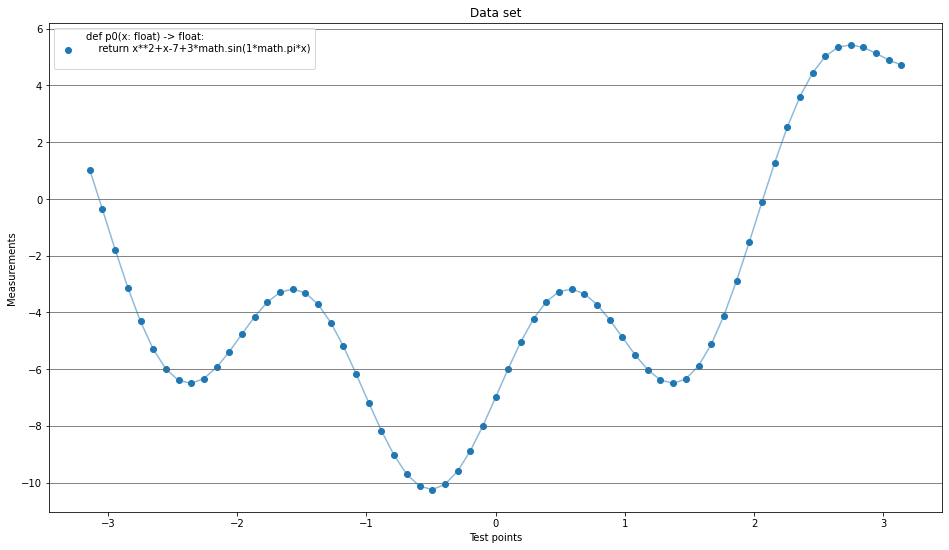

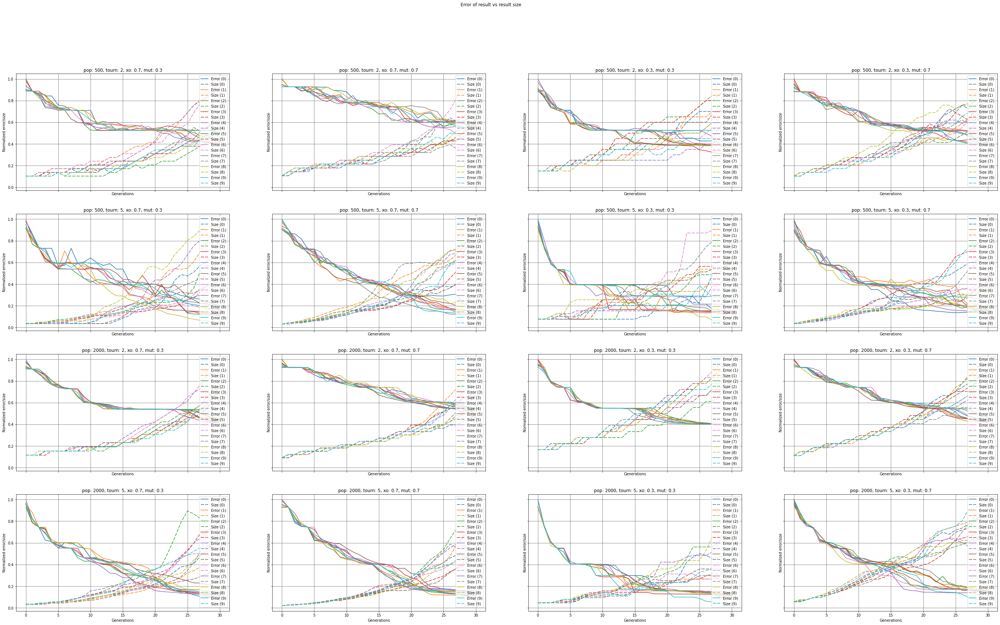

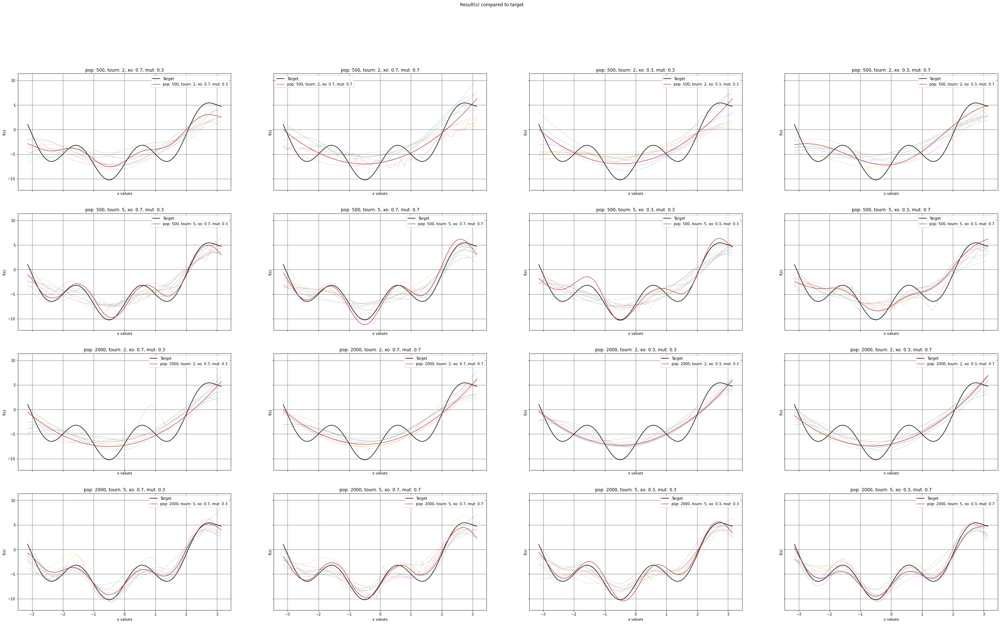

In [9]:
# we're testing the example function because why not.

def p0(x: float) -> float:
    return x**2+x-7+3*math.sin(1*math.pi*x)

pset0 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_0"),1)
pset0.addPrimitive(operator.add, 2)
pset0.addPrimitive(operator.sub, 2)
pset0.addPrimitive(operator.mul, 2)
pset0.addPrimitive(protectedDiv, 2)
pset0.addPrimitive(operator.neg, 1)
pset0.addPrimitive(math.cos, 1)
pset0.addPrimitive(math.sin, 1)
# numerical constants +-1
pset0.addTerminal(1)
pset0.addTerminal(-1)
pset0.addTerminal(math.pi)
pset0.addTerminal(-math.pi)
# also allowing the GP to use randomness
pset0.addEphemeralConstant(appendUniqueNameSuffix("rand101_0"), rand101)
pset0.renameArguments(ARG0='x')

theZerothTest: ParameterTester = ParameterTester(p0, primSet = pset0)



theZerothTest.runTheTests()



theZerothTest.showResults()


In [10]:
theZerothTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 3.2235926097434127
	2000 : 4.367788547016867
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 4.35370377982908
	2000 : 4.31875125156206
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 4.361572238312711
	2000 : 4.288424613157232
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 5.028985452460522
	2000 : 4.1514481201216356
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 0.574910664921302
	2000 : 0.7971559127632821
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 0.8699593724538733
	2000 : 0.7651405906333686
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 1.6276357719965113
	2000 : 0.7170009365703272
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 2.6704556943021953
	2000 : 0.5565933214040047

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 3.2235926097434127
	 5 : 0.574910664921302
pop 500  xo: 0.7  mut: 0.7:
	 2 : 4.35370377982908
	 5 : 0.8699593724538733
pop 500  xo: 0.3  mut: 0.3:
	 2 : 4.361572238312711
	 5 : 1.6276357719965113
pop 500  x

In [11]:
theZerothTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 1.0084602566442762
	Uncertainty: 0.34681426865981
This is not a significant difference. (<95%)

The best tournament size is 5
	Difference: 17.47640283932747
	Uncertainty: 4.942956192611229e-07
This is a very significant difference. >99%

The best crossover rate is 0.7
	Difference: -1.9197221517544956
	Uncertainty: 0.09636915583905316
This is not a significant difference. (<95%)

The best mutation rate is 0.3
	Difference: -1.8258660930694326
	Uncertainty: 0.11061358648388864
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 1.0084602566442762
	Uncertainty: 0.34681426865981
This is not a significant difference. (<95%)

The best tournament size is 5
	Difference: 17.47640283932747
	Uncertainty: 4.942956192611229e-07
This is a very significant difference. >99%

The best crossover rate is 0.7
	Differen

So far, we can see that a tournament size of 5 appears to be significantly better for the GA than a tournament size of 2, with an uncertainty factor so small it has to go into scientific notation.

There doesn't appear to be a very significant difference for the other hyper-parameters. There's a ~91% significant difference for crossover rate (0.7 better), and a ~89% significant difference for the mutation rate (0.3 better), with only a ~65% significant difference for population size (2000 better).

This is reflected in the graphs as well.

The graphs for a tournament size of 5 appeared to follow the target curve much more smoothly, whilst the tournament size of 2 appeared to lead to a very loose approximation of the curve, not following the bumps and such of the target. Looking at the normalized error rate and size results, the graphs using a tournament size of 2 got stuck at a normalized error of roughly 0.4, whilst the tournament size of 5 was able to get below that threshold.

The normalized error rates for a tournament of 2 might have been stuck at 0.4 because they could have started off lower than with a tournament of 5, meaning that it would be harder for it to decrease to less than 40% of the original accuracy. However, seeing as tournament size has no bearing on the initial population, this theory is unlikely. Additionally, as tournament sizes of 2 appear to produce a general approximation instead of a curve that follows the bumps of the original (like with a tournament of 5), this 0.4 floor could be because the smooth curve was a local minimum for the error rate, and the tournament of 2 prevented the GP from deviating from this local minimum.

In [12]:
# this is here to save memory by yeeting the last test from the globals
if memorySaving:
    del theZerothTest

    del pset0

# Test 2: Function p1(x) from the assignment brief

Testing: 
def p1(x: float) -> float:
    return (x**6) - 2 * (x**4) - 13 * (x ** 2)



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12366 evaluations.
	 sub(add(add(1, add(add(mul(sub(x, protectedDiv(add(1, -1), neg(0))), mul(mul(x, 1), sub(mul(neg(0), add(neg(-1), 1)), x))), add(neg(-1), mul(x, add(x, add(add(neg(-1), mul(x, add(x, add(mul(1, add(add(1, 1), 1)), add(add(x, add(add(-1, 1), add(mul(mul(x, add(neg(1), neg(1))), sub(add(sub(x, -1), sub(sub(protectedDiv(-1, 1), add(x, x)), -1)), x)), neg(mul(x, x))))), 1))))), mul(x, x)))))), add(x, 1))), x), -1)
	 6912.477330251465
Starting iteration 1
Iteration 1 done, 12296 evaluations.
	 mul(add(neg(protectedDiv(x, -1)), x), add(x, protectedDiv(mul(add(0, add(x, sub(neg(1), sub(x, mul(add(mul(add(x, add(add(x, protectedDiv(0, sub(mul(x, sub(1, 1)), sub(-1, x)))), protectedDiv(mul(mul(-1, 1), mul(1, mul(x, x))), 0))), x), add(x, 0)), x))))), x), add(x, 1))))
	 5534.7234488803415
Starting iteration 2
Iteration 2 done, 12310 evaluations.
	 mul(x, add(add(x, mul(mul(sub(-1, mul(add(x, x

Iteration 3 done, 8172 evaluations.
	 mul(sub(x, -1), sub(x, add(mul(protectedDiv(sub(mul(x, protectedDiv(add(0, 1), mul(sub(-1, -1), -1))), add(mul(protectedDiv(x, -1), neg(-1)), add(0, sub(neg(x), add(x, add(1, sub(x, 1))))))), -1), neg(mul(mul(-1, x), add(-1, x)))), add(sub(sub(1, -1), add(x, -1)), sub(neg(1), add(x, 1))))))
	 4300.374143919715
Starting iteration 4
Iteration 4 done, 8042 evaluations.
	 sub(mul(1, add(protectedDiv(-1, -1), sub(-1, 1))), mul(mul(add(add(x, x), protectedDiv(1, x)), neg(x)), mul(add(x, x), x)))
	 5171.51669601911
Starting iteration 5
Iteration 5 done, 8159 evaluations.
	 mul(protectedDiv(x, 1), add(add(mul(sub(x, -1), mul(x, x)), -1), mul(mul(protectedDiv(add(add(1, sub(add(-1, add(add(protectedDiv(add(add(1, sub(x, mul(-1, -1))), x), 1), 0), add(x, -1))), mul(-1, -1))), x), 1), add(x, 0)), x)))
	 4991.916881490329
Starting iteration 6
Iteration 6 done, 8093 evaluations.
	 mul(neg(sub(neg(add(x, add(x, sub(protectedDiv(1, neg(1)), neg(x))))), add(x, 1))

Iteration 7 done, 12381 evaluations.
	 mul(sub(mul(add(sub(-1, 0), neg(x)), x), mul(sub(add(neg(neg(1)), neg(-1)), mul(sub(1, mul(-1, add(1, x))), sub(add(neg(1), -1), mul(add(sub(1, x), sub(x, x)), mul(x, x))))), x)), sub(x, neg(-1)))
	 185.8792539231843
Starting iteration 8
Iteration 8 done, 12378 evaluations.
	 mul(mul(add(mul(add(-1, sub(0, 1)), sub(-1, x)), sub(x, -1)), sub(mul(0, protectedDiv(1, -1)), x)), mul(add(sub(x, -1), x), sub(protectedDiv(add(x, add(1, protectedDiv(protectedDiv(-1, -1), mul(x, 1)))), x), x)))
	 2958.9246593234225
Starting iteration 9
Iteration 9 done, 12298 evaluations.
	 mul(add(add(add(add(x, add(neg(sub(1, -1)), x)), add(x, x)), x), 1), add(protectedDiv(protectedDiv(x, -1), neg(-1)), add(1, mul(mul(mul(x, 1), x), x))))
	 3971.1542739871893
done
mul(add(x, sub(add(mul(x, mul(x, x)), x), sub(x, sub(sub(neg(0), protectedDiv(x, -1)), add(x, sub(x, protectedDiv(x, 1))))))), add(x, sub(add(mul(x, mul(x, x)), x), sub(x, sub(mul(-1, add(mul(x, 1), add(x, add(x

Iteration 8 done, 7989 evaluations.
	 mul(x, mul(mul(mul(x, 1), sub(neg(add(mul(-1, neg(x)), add(add(x, x), x))), x)), neg(x)))
	 4796.619341726157
Starting iteration 9
Iteration 9 done, 8054 evaluations.
	 mul(add(add(x, x), add(add(mul(x, 1), protectedDiv(0, 1)), add(protectedDiv(-1, x), add(-1, add(protectedDiv(-1, x), add(protectedDiv(-1, x), add(x, x))))))), add(add(add(add(add(x, x), x), x), x), x))
	 11222.600855101398
done
mul(mul(add(add(mul(x, add(mul(1, x), x)), neg(sub(sub(1, -1), -1))), neg(sub(1, -1))), x), add(sub(add(x, x), protectedDiv(-1, 0)), sub(neg(-1), protectedDiv(x, -1))))
2935.139686070803
plotted
x1, y3
pop: 500, tourn: 5, xo: 0.3, mut: 0.7
Starting iteration 0
Iteration 0 done, 12348 evaluations.
	 mul(add(x, sub(add(add(-1, x), sub(add(add(x, x), x), protectedDiv(sub(x, add(add(1, 1), sub(1, 1))), mul(protectedDiv(sub(sub(x, protectedDiv(protectedDiv(neg(1), neg(neg(1))), add(-1, x))), -1), neg(protectedDiv(sub(add(-1, x), 1), sub(0, x)))), -1)))), protected

Iteration 2 done, 56626 evaluations.
	 mul(add(sub(add(-1, mul(x, 1)), sub(neg(add(1, 1)), 1)), sub(sub(1, 1), sub(mul(neg(protectedDiv(protectedDiv(-1, 0), add(1, 1))), mul(x, add(add(add(add(protectedDiv(protectedDiv(mul(0, 1), 1), sub(protectedDiv(x, 1), 0)), -1), protectedDiv(mul(x, sub(sub(protectedDiv(x, protectedDiv(1, sub(sub(1, 1), mul(1, neg(0))))), protectedDiv(-1, add(protectedDiv(neg(1), add(x, x)), add(1, x)))), mul(1, 1))), 0)), protectedDiv(-1, -1)), mul(mul(x, x), x)))), protectedDiv(x, 1)))), mul(x, x))
	 3019.5354202816525
Starting iteration 3
Iteration 3 done, 56424 evaluations.
	 add(neg(mul(add(-1, x), sub(-1, sub(x, mul(add(add(protectedDiv(x, 1), sub(0, mul(add(x, protectedDiv(-1, x)), sub(add(add(mul(neg(x), sub(sub(sub(1, mul(x, x)), -1), x)), x), sub(-1, mul(-1, 1))), mul(mul(protectedDiv(-1, -1), 1), sub(-1, neg(x))))))), -1), x))))), x)
	 1020.4262465965668
Starting iteration 4
Iteration 4 done, 56561 evaluations.
	 add(1, mul(add(1, x), add(sub(add(-1, 1),

Iteration 3 done, 49362 evaluations.
	 sub(mul(sub(mul(-1, add(x, 0)), neg(protectedDiv(1, 1))), x), add(-1, mul(add(x, sub(mul(1, x), add(1, x))), sub(1, mul(add(mul(add(add(x, -1), sub(sub(1, mul(0, x)), neg(x))), mul(add(1, 1), protectedDiv(-1, 0))), sub(sub(x, -1), 1)), mul(x, sub(x, -1)))))))
	 4029.193143902777
Starting iteration 4
Iteration 4 done, 49289 evaluations.
	 mul(mul(add(-1, protectedDiv(x, 1)), mul(-1, x)), add(sub(neg(neg(sub(add(x, mul(-1, add(sub(neg(neg(x)), mul(mul(1, mul(protectedDiv(mul(add(x, 1), x), protectedDiv(sub(neg(-1), sub(1, 1)), -1)), protectedDiv(neg(mul(add(1, x), neg(1))), x))), -1)), sub(x, neg(protectedDiv(-1, 1)))))), add(1, 1)))), mul(mul(1, mul(protectedDiv(mul(add(x, 1), x), protectedDiv(sub(neg(-1), sub(1, 1)), -1)), protectedDiv(neg(add(protectedDiv(neg(-1), protectedDiv(-1, x)), sub(-1, -1))), protectedDiv(1, x)))), -1)), sub(x, -1)))
	 4171.985630801134
Starting iteration 5
Iteration 5 done, 49450 evaluations.
	 add(protectedDiv(sub(add(p

Iteration 2 done, 56702 evaluations.
	 mul(add(add(protectedDiv(x, 1), add(x, sub(protectedDiv(-1, add(add(-1, 1), 0)), neg(x)))), add(x, sub(-1, protectedDiv(add(sub(x, neg(x)), 1), add(-1, -1))))), mul(add(add(-1, add(neg(1), add(-1, -1))), mul(x, x)), add(x, x)))
	 823.8843301598301
Starting iteration 3
Iteration 3 done, 56573 evaluations.
	 add(mul(sub(mul(-1, x), add(x, x)), x), mul(add(add(protectedDiv(-1, mul(protectedDiv(sub(add(x, neg(0)), 0), x), sub(mul(1, 1), 1))), add(1, sub(x, x))), 1), mul(mul(add(mul(add(x, x), mul(x, x)), sub(protectedDiv(neg(add(1, sub(add(mul(sub(mul(x, add(protectedDiv(x, 1), mul(x, neg(neg(-1))))), -1), 0), 1), -1))), x), add(sub(add(protectedDiv(mul(add(sub(add(protectedDiv(-1, x), x), -1), add(add(x, add(x, x)), x)), mul(x, x)), mul(add(mul(add(x, add(1, sub(x, x))), mul(x, x)), sub(x, add(add(add(x, add(protectedDiv(neg(add(1, 1)), add(x, 1)), sub(mul(1, 0), mul(sub(mul(-1, 1), neg(1)), mul(protectedDiv(1, x), protectedDiv(1, -1)))))), add(-1, x

Iteration 3 done, 49474 evaluations.
	 add(mul(add(sub(add(x, -1), -1), add(add(add(add(1, x), 1), mul(1, add(x, x))), add(x, 1))), mul(add(sub(neg(add(add(protectedDiv(x, 1), protectedDiv(neg(0), add(1, x))), x)), protectedDiv(-1, protectedDiv(1, -1))), add(mul(add(-1, mul(add(protectedDiv(add(-1, -1), protectedDiv(1, 0)), x), protectedDiv(x, -1))), add(-1, -1)), add(protectedDiv(add(1, 1), add(1, 1)), x))), add(sub(1, -1), neg(neg(x))))), neg(0))
	 726.4513204887871
Starting iteration 4
Iteration 4 done, 49274 evaluations.
	 mul(x, add(neg(add(x, x)), mul(x, add(protectedDiv(mul(x, x), protectedDiv(protectedDiv(add(1, 1), mul(1, x)), x)), mul(x, add(mul(protectedDiv(1, x), protectedDiv(-1, 1)), x))))))
	 1493.03842214016
Starting iteration 5
Iteration 5 done, 49350 evaluations.
	 mul(sub(x, 1), mul(x, add(mul(add(x, x), protectedDiv(add(-1, add(mul(sub(0, 1), add(1, 1)), -1)), sub(x, 1))), mul(mul(x, add(add(-1, x), add(add(mul(mul(1, 1), neg(1)), add(protectedDiv(-1, -1), add(1, -1)

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


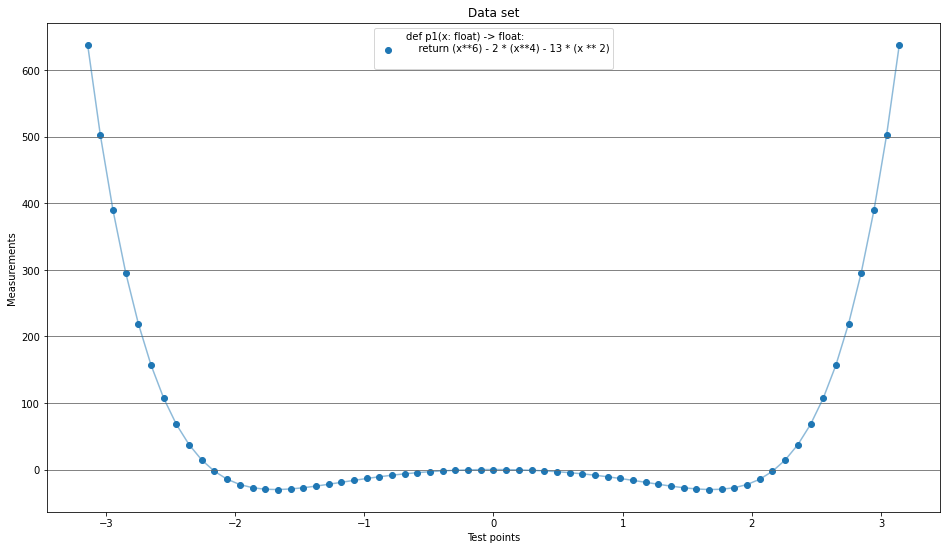

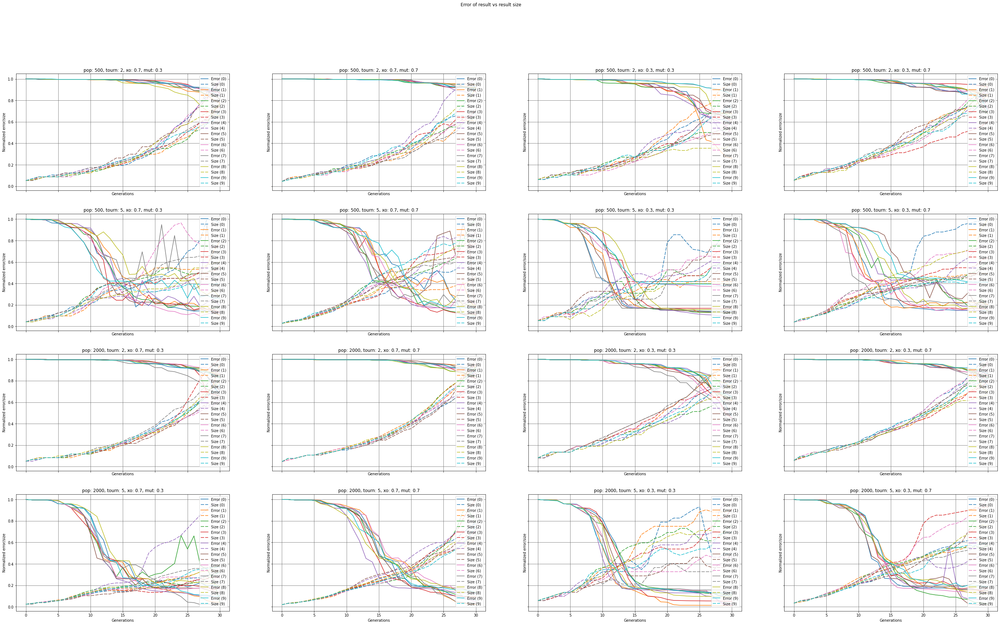

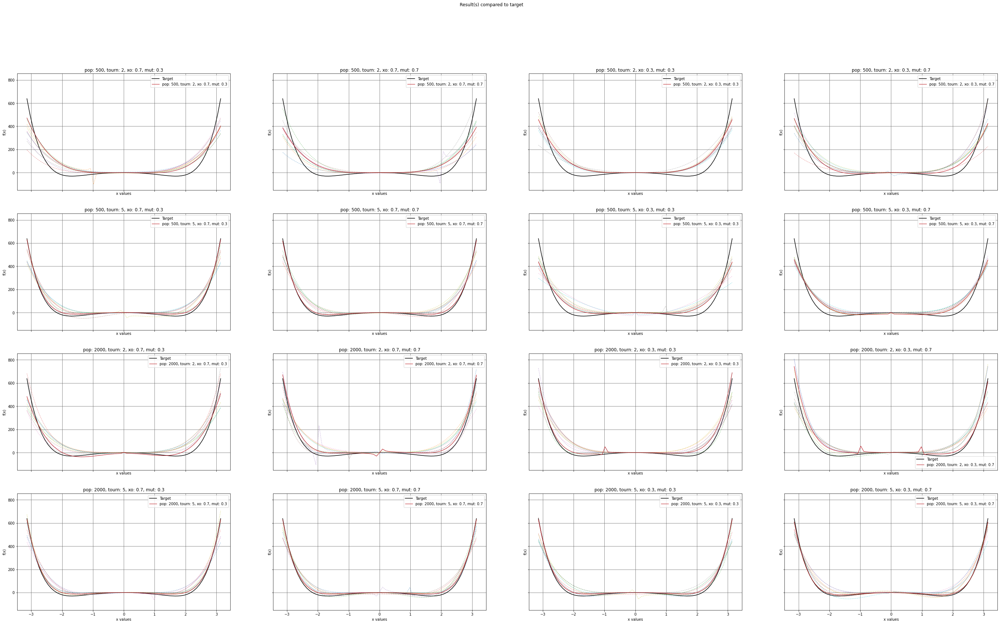

In [13]:
# this is the given equation p1(x) from the assignment brief.

def p1(x: float) -> float:
    return (x**6) - 2 * (x**4) - 13 * (x ** 2)


# it's been given a  somewhat basic primitive set, without any math constants, because those aren't needed.

pset1 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_1"),1)
pset1.addPrimitive(operator.add, 2)
pset1.addPrimitive(operator.sub, 2)
pset1.addPrimitive(operator.mul, 2)
pset1.addPrimitive(protectedDiv, 2)
pset1.addPrimitive(operator.neg, 1)
# numerical constants +-1
pset1.addTerminal(1)
pset1.addTerminal(-1)
# also allowing the GP to use randomness
#self.pset.addEphemeralConstant("rand101", lambda: random.randint(-1,1))
pset1.addEphemeralConstant(appendUniqueNameSuffix("rand101_1"), rand101)
#self.pset.addEphemeralConstant(ephemeral = rand101)
pset1.renameArguments(ARG0='x')

theFirstTest: ParameterTester = ParameterTester(p1, primSet = pset1, iterations = 10)


theFirstTest.runTheTests()



theFirstTest.showResults()

In [14]:
theFirstTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 4184.665042246145
	2000 : 1400.203623158093
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 5212.327155878231
	2000 : 821.8023211242344
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 4187.996735334743
	2000 : 733.0762644744998
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 2957.209715219965
	2000 : 1779.055522771877
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 159.12391579412045
	2000 : 159.1239157941203
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 111.37605885241778
	2000 : 159.12391579412025
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 2935.139686070803
	2000 : 159.12391579412028
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 2650.6074154518337
	2000 : 90.05787090784776

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 4184.665042246145
	 5 : 159.12391579412045
pop 500  xo: 0.7  mut: 0.7:
	 2 : 5212.327155878231
	 5 : 111.37605885241778
pop 500  xo: 0.3  mut: 0.3:
	 2 : 4187.996735334743
	 5 : 2935.139686070803
pop 500  xo:

In [15]:
theFirstTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 3.7610016993424127
	Uncertainty: 0.007065614126446017
This is a very significant difference. >99%

The best tournament size is 5
	Difference: 2.9980897321452464
	Uncertainty: 0.019996090855652873
This is a significant difference. (95%<=sig<=99%)

The best crossover rate is 0.7
	Difference: -0.7001317461750339
	Uncertainty: 0.5064401661606042
This is not a significant difference. (<95%)

The best mutation rate is 0.7
	Difference: 0.06335462273306453
	Uncertainty: 0.9512552872257436
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 2.7463277332019294
	Uncertainty: 0.014996576909186715
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.4275692484944713
	Uncertainty: 0.02825818396209277
This is a significant difference. (95%<=sig<=99%)

The best crossover 

Once again, a tournament size of 5 outperformed a tournament size of 2. But, interestingly, a population size of 2000 significantly outperformed a tournament size of 500.

The significance of the tournament size difference (\~98%) was less significant than that of the population size difference (\~99.3%) for this run, and this is reflected in the significances of the differences for all runs. Population size has an overall significance of ~98.5%, whilst tournament size only has an overall significance of ~97.2%

The tournament size difference is still very visible in the normalized error rate/size graphs, with the vast majority of cases with a tournament size of 2 having an error rate that stops decreasing earlier on, whilst a tournament size of 5 appears to allow the error rate to continue to decrease further and for longer.

However, the population difference is most visible in the graphs showing the target curves vs best curves. The population of 500 leads to curves that prematurely curve up at the start/end of the 'bowl' in the graph, whilst a population of 2000 most closely follows these curves.

The best crossover rate appears to be 0.7, albeit with a significance of only ~50%, and the differences between the mutation rate successes only has a significance of ~5%; in other words, there is a ~95% chance that mutation rate doesn't have a significant impact on the performance of the GP, and a ~50% chance that crossover rate also doesn't have an impact.

In [16]:
# this is here to save memory by yeeting the last test from the globals
if memorySaving:
    del theFirstTest

    del pset1

# Test 3: Equation p2(x)

Testing: 
def p2(x: float) -> float:
    return math.sin((math.pi/4) + 3 * x)



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12427 evaluations.
	 sin(protectedDiv(3.141592653589793, protectedDiv(-1, sub(protectedDiv(sub(neg(cos(-3.141592653589793)), -1), sin(-1)), x))))
	 0.11254628251911585
Starting iteration 1
Iteration 1 done, 12320 evaluations.
	 mul(sin(sub(-3.141592653589793, mul(-3.141592653589793, x))), sin(add(-3.141592653589793, 1)))
	 0.283276830987519
Starting iteration 2
Iteration 2 done, 12357 evaluations.
	 sin(sin(sin(add(mul(x, 3.141592653589793), protectedDiv(add(1, -3.141592653589793), -3.141592653589793)))))
	 0.051399239141144026
Starting iteration 3
Iteration 3 done, 12306 evaluations.
	 sin(neg(mul(neg(add(3.141592653589793, x)), -3.141592653589793)))
	 0.08605558526377377
Starting iteration 4
Iteration 4 done, 12383 evaluations.
	 sin(mul(neg(protectedDiv(-3.141592653589793, 1)), add(add(mul(1, x), sin(-1)), -1)))
	 0.07042983295002263
Starting iteration 5
Iteration 5 done, 12447 evaluations.
	 sin(mul

Iteration 3 done, 12351 evaluations.
	 sin(protectedDiv(-3.141592653589793, neg(protectedDiv(1, sub(3.141592653589793, sub(-3.141592653589793, x))))))
	 0.0401352756393495
Starting iteration 4
Iteration 4 done, 12341 evaluations.
	 sin(mul(cos(sin(sub(protectedDiv(x, protectedDiv(-1, 3.141592653589793)), sin(-1)))), cos(mul(3.141592653589793, x))))
	 0.204290595382273
Starting iteration 5
Iteration 5 done, 12401 evaluations.
	 sin(mul(add(add(-3.141592653589793, protectedDiv(mul(3.141592653589793, 0), sub(mul(protectedDiv(mul(3.141592653589793, 0), sub(mul(add(3.141592653589793, 1), add(3.141592653589793, 1)), cos(-3.141592653589793))), -3.141592653589793), cos(-3.141592653589793)))), protectedDiv(mul(1, protectedDiv(protectedDiv(x, 3.141592653589793), -3.141592653589793)), add(-3.141592653589793, 0))), neg(sub(add(sub(-3.141592653589793, 3.141592653589793), cos(sub(-1, -1))), x))))
	 0.007351088584910129
Starting iteration 6
Iteration 6 done, 12317 evaluations.
	 sin(sin(mul(3.1415926

Iteration 0 done, 8018 evaluations.
	 cos(sub(mul(x, mul(-1, 3.141592653589793)), sub(mul(sub(mul(x, -3.141592653589793), x), sin(sub(neg(-3.141592653589793), sin(3.141592653589793)))), sin(1))))
	 0.034512845007609705
Starting iteration 1
Iteration 1 done, 8311 evaluations.
	 sin(mul(neg(add(x, sin(sin(-1)))), 3.141592653589793))
	 0.033920350995860715
Starting iteration 2
Iteration 2 done, 8114 evaluations.
	 sin(mul(sub(mul(-3.141592653589793, sub(-1, protectedDiv(sin(-1), cos(-1)))), neg(x)), 3.141592653589793))
	 0.03362672755247009
Starting iteration 3
Iteration 3 done, 8056 evaluations.
	 cos(mul(sub(sub(1, add(mul(sin(neg(1)), 1), sub(x, -1))), cos(sin(sub(1, -1)))), -3.141592653589793))
	 0.037001017214606025
Starting iteration 4
Iteration 4 done, 8250 evaluations.
	 sin(add(mul(3.141592653589793, x), sub(cos(cos(sin(add(add(-1, 3.141592653589793), sin(sin(sub(-3.141592653589793, 3.141592653589793))))))), protectedDiv(mul(1, x), mul(3.141592653589793, 3.141592653589793)))))
	 

Iteration 2 done, 56523 evaluations.
	 sin(add(sin(neg(sin(-1))), mul(protectedDiv(x, -1), protectedDiv(-3.141592653589793, 1))))
	 0.03395142332418635
Starting iteration 3
Iteration 3 done, 56692 evaluations.
	 cos(add(mul(-1, mul(x, -3.141592653589793)), sin(-1)))
	 0.03451284500760992
Starting iteration 4
Iteration 4 done, 56514 evaluations.
	 sin(cos(sub(sub(mul(3.141592653589793, x), add(1, 3.141592653589793)), -3.141592653589793)))
	 0.05520127953309906
Starting iteration 5
Iteration 5 done, 56670 evaluations.
	 sin(mul(add(add(1, x), sin(sin(-1))), 3.141592653589793))
	 0.03392035099586075
Starting iteration 6
Iteration 6 done, 56578 evaluations.
	 sin(sin(add(cos(protectedDiv(sub(mul(1, 1), mul(x, -1)), -3.141592653589793)), mul(x, 3.141592653589793))))
	 0.01904768109544136
Starting iteration 7
Iteration 7 done, 56558 evaluations.
	 cos(add(-1, mul(neg(-1), mul(x, 3.141592653589793))))
	 0.05350024861344946
Starting iteration 8
Iteration 8 done, 56425 evaluations.
	 sin(sub(ad

Iteration 7 done, 49598 evaluations.
	 sin(add(-3.141592653589793, sub(protectedDiv(3.141592653589793, add(sub(sub(sin(mul(protectedDiv(protectedDiv(sin(-1), cos(sub(3.141592653589793, -3.141592653589793))), 1), 1)), mul(-1, neg(1))), sub(x, -3.141592653589793)), cos(mul(sub(sin(mul(sin(mul(add(cos(mul(sub(protectedDiv(3.141592653589793, -3.141592653589793), sub(protectedDiv(3.141592653589793, add(sub(sub(sin(mul(protectedDiv(protectedDiv(sin(0), cos(sub(3.141592653589793, -3.141592653589793))), add(sub(sub(sin(mul(protectedDiv(0, protectedDiv(sub(cos(x), mul(3.141592653589793, x)), x)), 1)), mul(-1, -3.141592653589793)), sub(x, x)), cos(x))), 1)), mul(-1, protectedDiv(3.141592653589793, -3.141592653589793))), sub(x, -3.141592653589793)), neg(1))), mul(3.141592653589793, x))), -3.141592653589793)), 3.141592653589793), sin(-3.141592653589793))), 1)), mul(-1, protectedDiv(3.141592653589793, add(-3.141592653589793, cos(-3.141592653589793))))), x)))), mul(3.141592653589793, x))))
	 0.00077

Iteration 9 done, 56631 evaluations.
	 sin(sub(mul(3.141592653589793, x), add(protectedDiv(x, sub(mul(neg(add(add(-3.141592653589793, 3.141592653589793), sin(cos(1)))), x), mul(mul(3.141592653589793, -1), add(3.141592653589793, add(0, add(sin(add(1, -3.141592653589793)), mul(sin(mul(mul(x, -3.141592653589793), protectedDiv(-3.141592653589793, sub(mul(-3.141592653589793, sub(protectedDiv(x, mul(3.141592653589793, mul(1, -1))), -1)), mul(1, 3.141592653589793))))), 0))))))), sin(cos(-3.141592653589793)))))
	 0.0007583535411150617
done
sin(add(mul(sub(sub(1, -1), neg(1)), x), sin(protectedDiv(mul(neg(sin(sub(-1, 1))), cos(1)), cos(protectedDiv(neg(neg(add(sub(add(neg(protectedDiv(sin(3.141592653589793), sub(3.141592653589793, x))), neg(1)), protectedDiv(1, -3.141592653589793)), protectedDiv(cos(mul(3.141592653589793, neg(neg(add(neg(3.141592653589793), mul(-1, -3.141592653589793)))))), sin(1))))), sub(x, x)))))))
6.749410850615867e-06
plotted
x3, y2
pop: 2000, tourn: 5, xo: 0.3, mut: 0.3
S

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


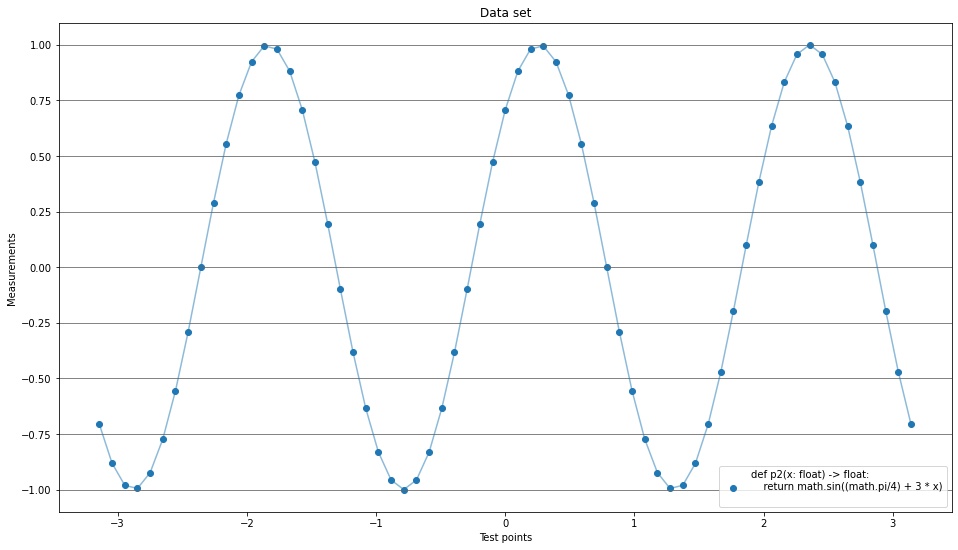

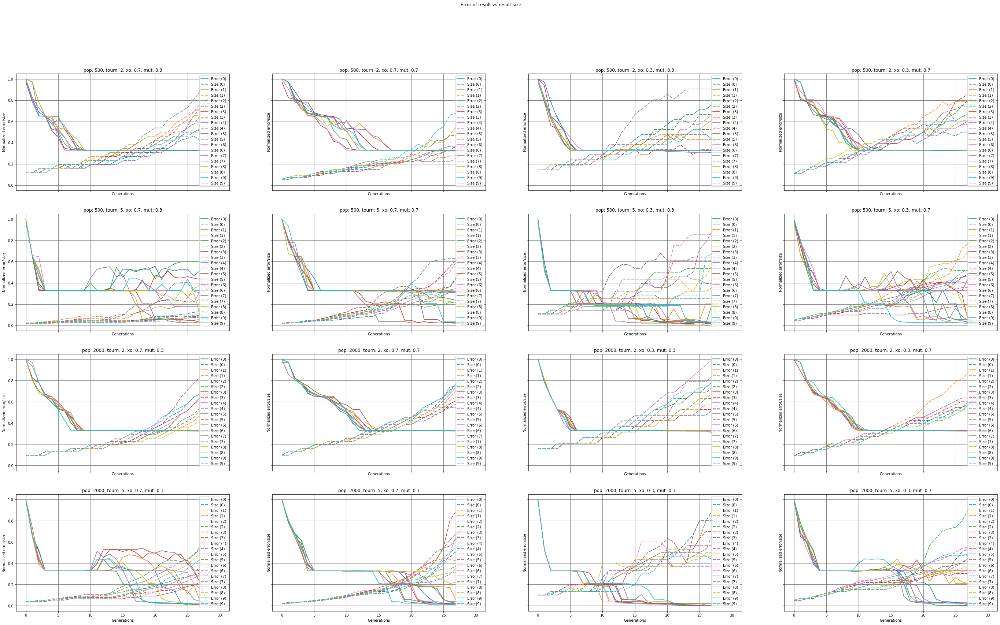

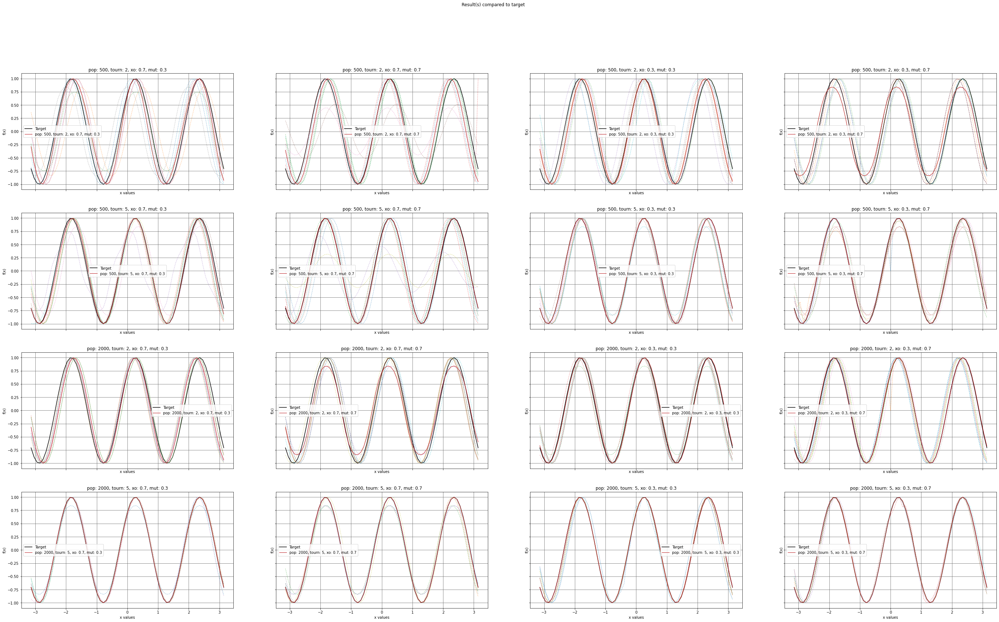

In [17]:
# equation p2(x) from the assignment brief

def p2(x: float) -> float:
    return math.sin((math.pi/4) + 3 * x)

pset2 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_2"),1)
pset2.addPrimitive(operator.add, 2)
pset2.addPrimitive(operator.sub, 2)
pset2.addPrimitive(operator.mul, 2)
pset2.addPrimitive(protectedDiv, 2)
pset2.addPrimitive(operator.neg, 1)
# we're giving the primitive set access to the sine and cosine functions
pset2.addPrimitive(math.cos, 1)
pset2.addPrimitive(math.sin, 1)
# numerical constants +-1
pset2.addTerminal(1)
pset2.addTerminal(-1)
# and we're also letting it use pi
pset2.addTerminal(math.pi)
pset2.addTerminal(-math.pi)
# also allowing the GP to use randomness
#self.pset.addEphemeralConstant("rand101", lambda: random.randint(-1,1))
pset2.addEphemeralConstant(appendUniqueNameSuffix("rand101_2"), rand101)
#self.pset.addEphemeralConstant(ephemeral = rand101)
pset2.renameArguments(ARG0='x')

theSecondTest: ParameterTester = ParameterTester(p2, primSet = pset2)



theSecondTest.runTheTests()



theSecondTest.showResults()

In [18]:
theSecondTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 0.030702814877956695
	2000 : 0.03361404351447871
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 0.03420267809877427
	2000 : 0.01904768109544136
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 0.033714508739386966
	2000 : 0.0015730238908942627
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 0.027731720371070988
	2000 : 0.000504883467645354
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 0.0032840792917595294
	2000 : 7.395137003975198e-07
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 0.0003903012688181925
	2000 : 6.749410850615867e-06
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 2.274891390953908e-07
	2000 : 1.361150809237126e-31
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 0.0002545289441524062
	2000 : 7.61194973631284e-09

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 0.030702814877956695
	 5 : 0.0032840792917595294
pop 500  xo: 0.7  mut: 0.7:
	 2 : 0.03420267809877427
	 5 : 0.0003903012688181925
pop 500  xo: 0.3  mut: 0.3:
	

In [19]:
theSecondTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 1.9518725844380318
	Uncertainty: 0.0919136671401752
This is not a significant difference. (<95%)

The best tournament size is 5
	Difference: 4.495379662145883
	Uncertainty: 0.0028138685135746825
This is a very significant difference. >99%

The best crossover rate is 0.3
	Difference: 1.6837742061787515
	Uncertainty: 0.13609949825605921
This is not a significant difference. (<95%)

The best mutation rate is 0.7
	Difference: 1.3208015332201573
	Uncertainty: 0.2281077860506105
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 2.5696805743155786
	Uncertainty: 0.01713172060809892
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.3079558215083047
	Uncertainty: 0.03034009900379672
This is a significant difference. (95%<=sig<=99%)

The best crossover rate is 0

Like the first test, the only parameter with a significant impact on the GA's performance was the tournament size, with a tournament size of 5 having a 99% significant positive impact on performance.

None of the others had a significant impact.

Once again, this is reflected in the graphs; the tournament of 2 ended up hitting a normalized error floor at roughly 0.3, with a generally notable difference between the red (best) line and the black (target) line.

However, the running totals tell a slightly different story.

Population size (of 2000) still has the most significant positive improvement (of ~98%), followed by tournament size (5 best, ~97% significance), with crossover rate and mutation rate still being very insignificant.

In [20]:
# this is here to save memory by yeeting the last test from the globals
if memorySaving:
    del theSecondTest

    del pset2

# Test 4: function p3(x)

Testing: 
def p3(x: float) -> float:
    return p3n(-1.7, 0.5, x) + p3n(1.3, 0.8, x)



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12270 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(x, sub(mul(sub(mul(neg(protectedSqrt(sub(-1, 2.718281828459045))), 2.718281828459045), x), add(add(neg(x), protectedSqrt(-3.141592653589793)), protectedDiv(1, 3.141592653589793))), -2.718281828459045))), 2.718281828459045)
	 0.03968646113683395
Starting iteration 1
Iteration 1 done, 12377 evaluations.
	 protectedDiv(add(protectedDiv(1, add(sub(add(mul(mul(3.141592653589793, protectedSqrt(sub(-1, -3.141592653589793))), mul(sub(-1, add(add(sub(2.718281828459045, neg(-1)), neg(add(x, 2.718281828459045))), 2.718281828459045)), 2.718281828459045)), neg(protectedSqrt(x))), neg(sub(1, sub(3.141592653589793, -1)))), -1)), protectedSqrt(-2.718281828459045)), 3.141592653589793)
	 0.04438019875478192
Starting iteration 2
Iteration 2 done, 12335 evaluations.
	 protectedDiv(protectedSqrt(mul(neg(sub(-2.718281828459045, x)), sub(protectedSqrt(protectedDiv(x

Iteration 2 done, 8105 evaluations.
	 protectedDiv(protectedSqrt(mul(add(-1, mul(-2.718281828459045, x)), add(2.718281828459045, x))), 3.141592653589793)
	 0.030655457208811125
Starting iteration 3
Iteration 3 done, 8164 evaluations.
	 protectedDiv(protectedSqrt(sub(protectedDiv(sub(protectedDiv(add(protectedSqrt(protectedSqrt(-1)), -2.718281828459045), add(1, -1)), -2.718281828459045), protectedSqrt(sub(3.141592653589793, add(add(protectedSqrt(add(protectedSqrt(sub(1, 3.141592653589793)), -3.141592653589793)), sub(-2.718281828459045, x)), 3.141592653589793)))), add(add(-2.718281828459045, 2.718281828459045), 3.141592653589793))), 3.141592653589793)
	 0.036466121243752196
Starting iteration 4
Iteration 4 done, 8212 evaluations.
	 protectedDiv(1, add(protectedSqrt(3.141592653589793), protectedSqrt(sub(mul(neg(-1), protectedDiv(-3.141592653589793, -3.141592653589793)), protectedDiv(mul(x, 2.718281828459045), add(sub(x, 1), -2.718281828459045))))))
	 0.037457387074765446
Starting iteratio

Iteration 3 done, 12391 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(sub(mul(mul(x, x), neg(-1)), mul(-3.141592653589793, x)), protectedDiv(-1, protectedSqrt(x)))), 3.141592653589793)
	 0.03185864474355842
Starting iteration 4
Iteration 4 done, 12352 evaluations.
	 protectedDiv(protectedSqrt(protectedSqrt(protectedDiv(add(x, protectedDiv(1, mul(-3.141592653589793, 1))), protectedDiv(neg(sub(protectedDiv(protectedDiv(x, sub(neg(protectedSqrt(protectedSqrt(sub(neg(protectedSqrt(protectedSqrt(neg(protectedSqrt(sub(neg(protectedSqrt(neg(protectedDiv(protectedDiv(x, protectedDiv(add(x, protectedDiv(x, 3.141592653589793)), protectedDiv(protectedSqrt(neg(sub(protectedDiv(protectedDiv(neg(neg(2.718281828459045)), sub(neg(protectedSqrt(neg(protectedDiv(protectedDiv(x, -1), protectedSqrt(protectedDiv(x, sub(neg(protectedSqrt(-1)), protectedSqrt(mul(x, 1))))))))), protectedDiv(x, x))), protectedSqrt(neg(add(x, 0)))), protectedDiv(x, x)))), protectedDiv(protectedSqrt(2.718281828459045), 

Iteration 1 done, 14215 evaluations.
	 protectedDiv(-3.141592653589793, add(sub(-3.141592653589793, sub(neg(-3.141592653589793), protectedDiv(1, add(protectedDiv(protectedDiv(add(x, sub(protectedDiv(-1, -3.141592653589793), mul(protectedDiv(neg(protectedSqrt(sub(1, -2.718281828459045))), sub(-2.718281828459045, 1)), protectedDiv(protectedDiv(sub(-1, -1), x), mul(mul(1, 0), protectedDiv(x, protectedSqrt(0))))))), sub(3.141592653589793, 0)), 3.141592653589793), add(-2.718281828459045, -1))))), sub(-3.141592653589793, protectedDiv(protectedDiv(add(x, sub(protectedDiv(-1, -3.141592653589793), mul(protectedDiv(neg(protectedSqrt(mul(protectedSqrt(x), protectedDiv(3.141592653589793, -2.718281828459045)))), neg(protectedSqrt(1))), protectedDiv(3.141592653589793, 2.718281828459045)))), 3.141592653589793), add(x, sub(protectedDiv(-1, -3.141592653589793), mul(protectedDiv(neg(protectedSqrt(sub(3.141592653589793, 0))), sub(-2.718281828459045, x)), protectedDiv(protectedDiv(sub(protectedSqrt(-2.718

Iteration 0 done, 8067 evaluations.
	 protectedDiv(protectedSqrt(protectedSqrt(protectedDiv(protectedDiv(x, mul(protectedDiv(-2.718281828459045, 3.141592653589793), protectedDiv(-2.718281828459045, 0))), sub(x, add(protectedSqrt(mul(protectedSqrt(protectedSqrt(protectedDiv(protectedDiv(x, mul(protectedDiv(neg(1), 3.141592653589793), protectedDiv(-2.718281828459045, 0))), sub(x, add(protectedSqrt(mul(1, -2.718281828459045)), neg(3.141592653589793)))))), sub(x, add(protectedSqrt(-1), neg(3.141592653589793))))), neg(2.718281828459045)))))), 3.141592653589793)
	 0.025138510168841343
Starting iteration 1
Iteration 1 done, 8047 evaluations.
	 protectedDiv(sub(protectedSqrt(protectedDiv(x, add(neg(add(-1, x)), -2.718281828459045))), -1), add(3.141592653589793, 3.141592653589793))
	 0.03448258076036962
Starting iteration 2
Iteration 2 done, 8160 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(sub(x, -2.718281828459045), -3.141592653589793)), neg(add(add(neg(2.718281828459045), protected

Iteration 9 done, 12418 evaluations.
	 protectedDiv(protectedSqrt(mul(mul(add(protectedDiv(1, -2.718281828459045), protectedSqrt(protectedDiv(protectedDiv(protectedSqrt(-1), mul(protectedDiv(protectedDiv(2.718281828459045, 2.718281828459045), -3.141592653589793), mul(neg(mul(sub(protectedSqrt(neg(3.141592653589793)), sub(x, -3.141592653589793)), -1)), 1))), protectedDiv(-3.141592653589793, -1)))), x), sub(-3.141592653589793, x))), 3.141592653589793)
	 0.022892043327522274
done
protectedDiv(protectedSqrt(protectedDiv(mul(sub(-2.718281828459045, x), protectedDiv(protectedDiv(-1, -3.141592653589793), add(mul(x, -1), protectedDiv(-2.718281828459045, -2.718281828459045)))), 2.718281828459045)), protectedDiv(3.141592653589793, protectedDiv(protectedSqrt(sub(-2.718281828459045, add(neg(add(-2.718281828459045, 3.141592653589793)), neg(protectedSqrt(protectedSqrt(sub(3.141592653589793, -1))))))), protectedSqrt(protectedSqrt(protectedDiv(add(protectedSqrt(sub(sub(2.718281828459045, 1), protected

Iteration 7 done, 56652 evaluations.
	 protectedDiv(protectedSqrt(sub(protectedDiv(mul(protectedDiv(3.141592653589793, 2.718281828459045), protectedDiv(neg(protectedDiv(1, 2.718281828459045)), neg(1))), add(protectedSqrt(add(3.141592653589793, 1)), -2.718281828459045)), mul(protectedDiv(mul(sub(-3.141592653589793, 1), add(3.141592653589793, x)), 2.718281828459045), protectedDiv(sub(mul(x, 3.141592653589793), 0), mul(-3.141592653589793, protectedSqrt(-2.718281828459045)))))), 3.141592653589793)
	 0.03311430947920145
Starting iteration 8
Iteration 8 done, 56570 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(protectedSqrt(mul(sub(protectedDiv(-1, -1), -1), mul(-3.141592653589793, protectedDiv(protectedDiv(mul(add(-2.718281828459045, protectedDiv(mul(-3.141592653589793, mul(-3.141592653589793, 2.718281828459045)), sub(mul(2.718281828459045, 2.718281828459045), -1))), 2.718281828459045), sub(2.718281828459045, 2.718281828459045)), protectedDiv(-3.141592653589793, -3.141592653589793)

Iteration 8 done, 49583 evaluations.
	 protectedDiv(protectedSqrt(add(neg(sub(add(mul(add(1, x), add(2.718281828459045, x)), 1), 1)), protectedSqrt(add(3.141592653589793, -1)))), 3.141592653589793)
	 0.03323509815660766
Starting iteration 9
Iteration 9 done, 49501 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(1, sub(-2.718281828459045, add(add(protectedDiv(3.141592653589793, x), add(3.141592653589793, 3.141592653589793)), sub(add(add(x, -2.718281828459045), protectedSqrt(0)), mul(protectedSqrt(-3.141592653589793), protectedDiv(3.141592653589793, protectedDiv(2.718281828459045, 2.718281828459045)))))))), 2.718281828459045)
	 0.03304393381587162
done
protectedDiv(protectedSqrt(protectedDiv(2.718281828459045, mul(-2.718281828459045, sub(add(protectedDiv(1, 2.718281828459045), sub(neg(-2.718281828459045), protectedDiv(-2.718281828459045, x))), mul(x, -1))))), neg(-3.141592653589793))
0.025331034232933897
plotted
x3, y0
pop: 2000, tourn: 5, xo: 0.7, mut: 0.3
Starting iteration 0
It

Iteration 0 done, 56640 evaluations.
	 protectedDiv(protectedSqrt(add(protectedSqrt(protectedSqrt(protectedDiv(sub(protectedDiv(mul(add(3.141592653589793, 1), protectedSqrt(-2.718281828459045)), mul(add(-1, x), -1)), protectedSqrt(sub(0, mul(-1, -2.718281828459045)))), add(0, add(protectedSqrt(mul(mul(0, 3.141592653589793), mul(-1, 3.141592653589793))), 3.141592653589793))))), protectedDiv(neg(neg(-1)), mul(add(protectedDiv(2.718281828459045, add(mul(-2.718281828459045, -1), neg(1))), x), protectedSqrt(protectedSqrt(add(1, 2.718281828459045))))))), 3.141592653589793)
	 0.02889253458755886
Starting iteration 1
Iteration 1 done, 56509 evaluations.
	 protectedDiv(protectedSqrt(add(sub(-3.141592653589793, sub(protectedDiv(-1, sub(add(-1, x), neg(3.141592653589793))), protectedSqrt(sub(1, sub(protectedSqrt(-3.141592653589793), neg(x)))))), 2.718281828459045)), sub(3.141592653589793, protectedDiv(protectedDiv(protectedSqrt(protectedDiv(mul(protectedSqrt(x), add(add(sub(sub(add(protectedDiv(x

Iteration 7 done, 56722 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(protectedDiv(neg(x), protectedSqrt(mul(x, protectedDiv(protectedDiv(1, 2.718281828459045), protectedSqrt(x))))), protectedSqrt(mul(neg(mul(sub(1, x), neg(3.141592653589793))), mul(3.141592653589793, sub(neg(mul(neg(protectedSqrt(protectedSqrt(add(x, add(-1, 3.141592653589793))))), 1)), protectedSqrt(mul(1, 1)))))))), mul(neg(protectedSqrt(protectedSqrt(add(x, protectedSqrt(2.718281828459045))))), -3.141592653589793))
	 0.02895868500587492
Starting iteration 8
Iteration 8 done, 56608 evaluations.
	 protectedDiv(protectedSqrt(-3.141592653589793), mul(protectedSqrt(protectedSqrt(3.141592653589793)), add(protectedSqrt(-1), protectedSqrt(mul(add(protectedSqrt(2.718281828459045), x), add(sub(protectedDiv(1, add(protectedDiv(3.141592653589793, x), add(add(-1, add(x, add(mul(mul(x, protectedSqrt(mul(add(protectedSqrt(add(sub(protectedDiv(x, 0), protectedDiv(mul(add(-1, -1), -1), protectedSqrt(mul(add(protectedSqrt(a

Iteration 6 done, 32405 evaluations.
	 protectedDiv(protectedSqrt(neg(x)), protectedDiv(protectedDiv(protectedDiv(neg(-3.141592653589793), protectedSqrt(sub(neg(x), 2.718281828459045))), protectedSqrt(protectedDiv(sub(-2.718281828459045, x), protectedSqrt(neg(-3.141592653589793))))), protectedSqrt(sub(x, 2.718281828459045))))
	 0.028329145840494608
Starting iteration 7
Iteration 7 done, 32602 evaluations.
	 mul(protectedDiv(neg(protectedSqrt(mul(x, sub(neg(x), 3.141592653589793)))), -3.141592653589793), protectedSqrt(sub(neg(neg(x)), 2.718281828459045)))
	 0.027722442679481502
Starting iteration 8
Iteration 8 done, 32741 evaluations.
	 protectedDiv(protectedSqrt(add(sub(protectedDiv(mul(add(x, 3.141592653589793), add(x, -3.141592653589793)), protectedDiv(2.718281828459045, x)), 2.718281828459045), 1)), 3.141592653589793)
	 0.028764008554838294
Starting iteration 9
Iteration 9 done, 32643 evaluations.
	 protectedDiv(add(-3.141592653589793, protectedSqrt(mul(add(x, -1), sub(sub(x, -2.718

Iteration 9 done, 49488 evaluations.
	 protectedDiv(protectedSqrt(protectedDiv(sub(mul(protectedSqrt(mul(add(protectedSqrt(sub(mul(-2.718281828459045, -1), 1)), sub(protectedDiv(3.141592653589793, x), protectedDiv(-3.141592653589793, 2.718281828459045))), -3.141592653589793)), x), mul(1, -2.718281828459045)), mul(add(sub(-2.718281828459045, mul(sub(sub(sub(mul(-2.718281828459045, 2.718281828459045), -1), mul(x, 1)), 1), protectedSqrt(neg(-1)))), -2.718281828459045), 1))), protectedDiv(-3.141592653589793, -1))
	 0.026996530385664394
done
protectedDiv(protectedSqrt(protectedDiv(protectedSqrt(mul(sub(x, -3.141592653589793), 1)), sub(mul(sub(x, -3.141592653589793), -3.141592653589793), add(1, protectedDiv(mul(-3.141592653589793, -3.141592653589793), x))))), add(protectedSqrt(add(x, protectedSqrt(3.141592653589793))), sub(3.141592653589793, 1)))
0.014934615219576626
plotted


The best overall result, with an error of 0.008678522123852062 was:
mul(protectedDiv(protectedSqrt(protectedDiv(mul(

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


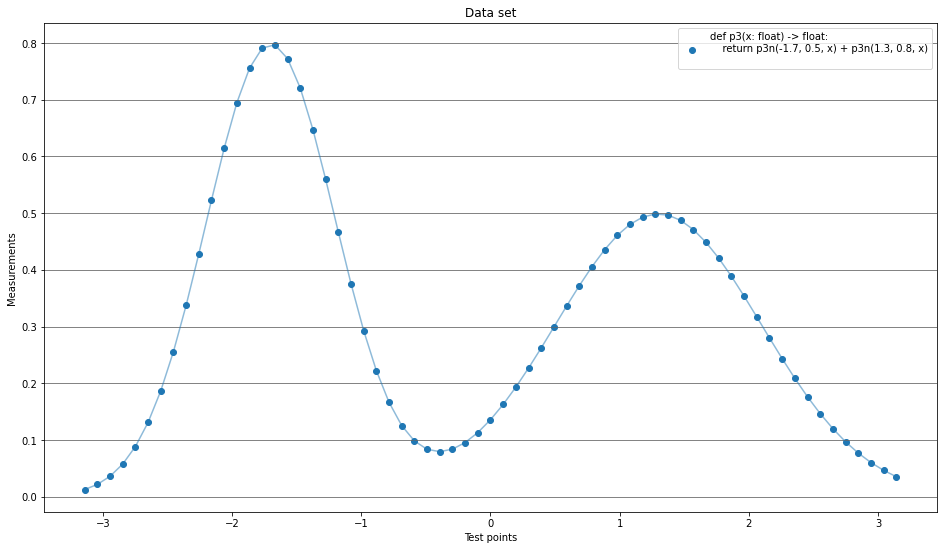

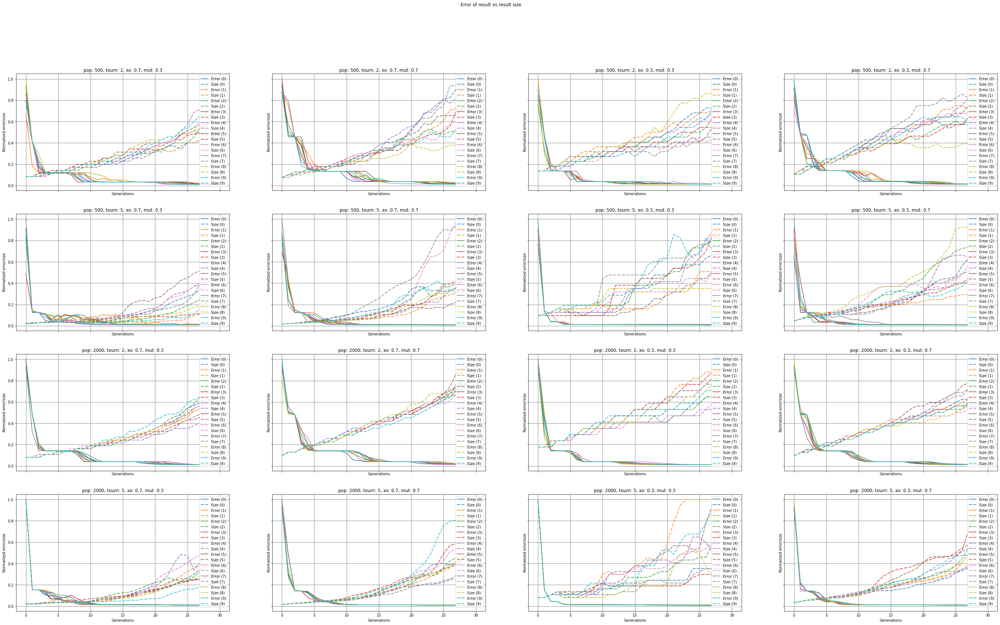

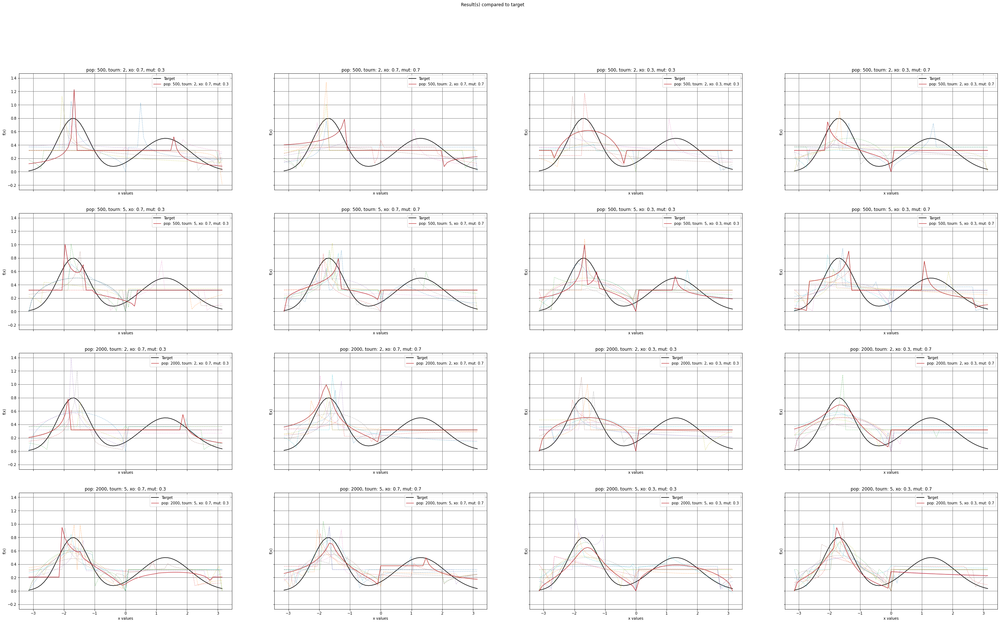

In [21]:

# function p3(x) from the assignment brief
def p3(x: float) -> float:
    return p3n(-1.7, 0.5, x) + p3n(1.3, 0.8, x)

# and this is the 'where M(thing, other thing) = ' from p3(x)
def p3n(a: float, b: float, x: float) -> float:
    return (1/(b * math.sqrt(2 * math.pi))) * math.e ** (-0.5 * ((x - a)/b) ** 2)

pset3 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_3"),1)
pset3.addPrimitive(operator.add, 2)
pset3.addPrimitive(operator.sub, 2)
pset3.addPrimitive(operator.mul, 2)
pset3.addPrimitive(protectedDiv, 2)
pset3.addPrimitive(operator.neg, 1)
pset3.addPrimitive(protectedSqrt, 1) #it has access to the protected square root function as well now
pset3.addTerminal(math.pi) # as well as pi
pset3.addTerminal(-math.pi)
pset3.addTerminal(math.e) # and the big famous constant e (2.718281828something)
pset3.addTerminal(-math.e)
# numerical constants +-1
pset3.addTerminal(1)
pset3.addTerminal(-1)
# also allowing the GP to use randomness
pset3.addEphemeralConstant(appendUniqueNameSuffix("rand101_3"), rand101)
pset3.renameArguments(ARG0='x')


theThirdTest: ParameterTester = ParameterTester(p3, primSet = pset3)



theThirdTest.runTheTests()



theThirdTest.showResults()

In [22]:
theThirdTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 0.03511780523747168
	2000 : 0.03139403507986608
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 0.035681594190475306
	2000 : 0.02871045340938609
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 0.030655457208811125
	2000 : 0.031921116359749785
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 0.031192522260710714
	2000 : 0.025331034232933897
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 0.026000956267753852
	2000 : 0.0201491472846231
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 0.026538146718670524
	2000 : 0.015778356204379507
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 0.018700275705293264
	2000 : 0.008678522123852062
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 0.02113171504399285
	2000 : 0.014934615219576626

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 0.03511780523747168
	 5 : 0.026000956267753852
pop 500  xo: 0.7  mut: 0.7:
	 2 : 0.035681594190475306
	 5 : 0.026538146718670524
pop 500  xo: 0.3  mut: 0.3:
	 2 : 0.030655

In [23]:
theThirdTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 4.551150948235701
	Uncertainty: 0.002632487411736869
This is a very significant difference. >99%

The best tournament size is 5
	Difference: 7.489572534501555
	Uncertainty: 0.00013851431841185324
This is a very significant difference. >99%

The best crossover rate is 0.3
	Difference: 3.4963420584236795
	Uncertainty: 0.010042419968875256
This is a significant difference. (95%<=sig<=99%)

The best mutation rate is 0.7
	Difference: 0.2903796014063278
	Uncertainty: 0.7799399240360595
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 2.4956084669824583
	Uncertainty: 0.018105098304504935
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.256089836094447
	Uncertainty: 0.031263993024580654
This is a significant difference. (95%<=sig<=99%)

The best crossover r

Interestingly, unlike all the other tests, this test indicated that crossover rate does have a significant impact on the GA's performance, showing a crossover rate of 0.3 being better than a crossover rate of 0.7, with significance of just below 99%.

It still shows the same strong significance between population size/tournament size and GP performance, both in this run (significances of >99%), and for all the tests performed so far.

However, the overall stats still show a complete lack of any significance for the mutation rates and crossover rates, even if the crossover rates are significant for this one test.


The normalized error vs size graphs for this test are still rather interesting. Unlike all of the previous runs, there doesn't appear to be a particular 'floor' which some configurations get stuck in; instead, they all appear to reach roughly the same 'floor' as each other.

When looking at the result vs target graphs, they also tell an interesting story. Instead of any of the lines following the curve closely, they are all very clearly approximations. generally attempting to follow the first curve and having the second curve as a straight line. In fact, only the best result, from the configuration `pop: 2000, tourn: 5, xo: 0.3, mut: 0.3`, has a 'double-hump' shape, and none of the other results from that configuration came close. However, this does imply that this result was only achieved through luck for that particular iteration, and not due to any inherent benefits from this particular configuration of hyper-parameters.

In [24]:
# this is here to save memory by yeeting the last test from the globals
if memorySaving:
    del theThirdTest

    del pset3

# Test 5: p(x) = cos(x)

This next test is to see whether or not the GP can reverse-engineer the cosine function

Testing: 
def p4(x: float) -> float:
    return math.cos(x)



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12351 evaluations.
	 protectedDiv(0, x)
	 0.49230769230769234
Starting iteration 1
Iteration 1 done, 12374 evaluations.
	 protectedDiv(1, sub(add(mul(x, x), 1), sub(-1, 0)))
	 0.406940266129359
Starting iteration 2
Iteration 2 done, 12366 evaluations.
	 protectedDiv(mul(mul(1, protectedDiv(1, x)), x), add(add(1, protectedDiv(mul(add(add(x, 0), mul(x, 1)), x), add(x, 1))), protectedDiv(sub(-1, -1), sub(add(neg(x), protectedDiv(x, mul(x, x))), mul(-1, sub(add(neg(sub(-1, x)), sub(protectedDiv(neg(1), protectedDiv(1, 1)), 1)), mul(-1, 1)))))))
	 0.3649263431392645
Starting iteration 3
Iteration 3 done, 12367 evaluations.
	 protectedDiv(-1, neg(sub(1, mul(sub(-1, x), protectedDiv(x, 1)))))
	 0.4436433115824593
Starting iteration 4
Iteration 4 done, 12263 evaluations.
	 protectedDiv(1, protectedDiv(sub(x, mul(add(-1, mul(neg(x), add(add(protectedDiv(-1, add(-1, x)), mul(neg(x), add(x, sub(mul(neg(-1), x), -1

Iteration 0 done, 12347 evaluations.
	 protectedDiv(x, add(protectedDiv(mul(x, mul(neg(neg(x)), x)), protectedDiv(mul(1, mul(protectedDiv(protectedDiv(neg(mul(mul(add(mul(sub(neg(neg(add(0, x))), x), protectedDiv(neg(1), protectedDiv(mul(x, 0), protectedDiv(1, x)))), add(x, x)), add(protectedDiv(-1, 0), neg(-1))), x)), 0), sub(mul(x, x), mul(protectedDiv(add(0, x), protectedDiv(mul(x, mul(protectedDiv(protectedDiv(neg(mul(mul(mul(mul(x, mul(add(mul(sub(x, 0), protectedDiv(sub(x, x), neg(neg(-1)))), add(mul(0, -1), x)), 0)), protectedDiv(mul(1, x), -1)), x), x)), 0), sub(mul(x, x), mul(x, -1))), add(sub(protectedDiv(-1, -1), protectedDiv(protectedDiv(-1, 1), mul(1, x))), protectedDiv(1, x)))), x)), mul(1, -1)))), add(sub(protectedDiv(-1, -1), protectedDiv(sub(x, 1), 0)), x))), x)), x))
	 0.2672201582766738
Starting iteration 1
Iteration 1 done, 12235 evaluations.
	 protectedDiv(protectedDiv(x, add(protectedDiv(-1, -1), mul(mul(x, mul(add(x, x), x)), x))), add(x, 0))
	 0.2774043561816873

Iteration 4 done, 8127 evaluations.
	 protectedDiv(add(-1, 1), x)
	 0.49230769230769234
Starting iteration 5
Iteration 5 done, 8008 evaluations.
	 protectedDiv(0, x)
	 0.49230769230769234
Starting iteration 6
Iteration 6 done, 8132 evaluations.
	 protectedDiv(0, x)
	 0.49230769230769234
Starting iteration 7
Iteration 7 done, 8125 evaluations.
	 protectedDiv(sub(1, 1), x)
	 0.49230769230769234
Starting iteration 8
Iteration 8 done, 8165 evaluations.
	 protectedDiv(add(1, -1), mul(x, x))
	 0.49230769230769234
Starting iteration 9
Iteration 9 done, 8114 evaluations.
	 protectedDiv(protectedDiv(0, x), protectedDiv(x, 1))
	 0.49230769230769234
done
protectedDiv(add(x, 0), add(x, mul(mul(x, x), add(sub(mul(mul(x, x), add(x, mul(mul(mul(mul(x, x), add(sub(x, 1), mul(1, 1))), x), add(x, mul(protectedDiv(neg(-1), neg(add(x, mul(mul(mul(mul(x, 0), mul(1, mul(mul(x, x), x))), x), x)))), 1))))), 1), mul(1, 1)))))
0.2652625410071718
plotted
x1, y3
pop: 500, tourn: 5, xo: 0.3, mut: 0.7
Starting iter

Iteration 0 done, 32652 evaluations.
	 protectedDiv(neg(1), neg(mul(mul(mul(-1, x), add(add(add(add(protectedDiv(1, x), -1), 1), 0), x)), -1)))
	 0.37086977629370865
Starting iteration 1
Iteration 1 done, 32542 evaluations.
	 protectedDiv(1, mul(x, add(x, protectedDiv(1, protectedDiv(x, 1)))))
	 0.37086977629370865
Starting iteration 2
Iteration 2 done, 32543 evaluations.
	 protectedDiv(protectedDiv(x, sub(mul(x, protectedDiv(add(x, x), sub(1, 0))), -1)), x)
	 0.328203872250198
Starting iteration 3
Iteration 3 done, 32768 evaluations.
	 protectedDiv(1, add(mul(sub(x, 1), add(-1, x)), x))
	 0.4436433115824593
Starting iteration 4
Iteration 4 done, 32544 evaluations.
	 protectedDiv(-1, mul(x, sub(neg(x), protectedDiv(1, x))))
	 0.37086977629370865
Starting iteration 5
Iteration 5 done, 32749 evaluations.
	 protectedDiv(sub(-1, x), add(protectedDiv(-1, sub(1, x)), x))
	 0.17020176477546994
Starting iteration 6
Iteration 6 done, 32383 evaluations.
	 protectedDiv(protectedDiv(0, 1), neg(x))

Iteration 0 done, 56757 evaluations.
	 protectedDiv(mul(mul(1, sub(-1, mul(1, x))), protectedDiv(sub(x, protectedDiv(add(protectedDiv(sub(protectedDiv(1, -1), neg(-1)), 1), mul(1, sub(-1, mul(1, x)))), sub(-1, add(add(protectedDiv(mul(add(mul(-1, 1), neg(add(0, 0))), -1), mul(-1, protectedDiv(0, add(sub(x, -1), add(add(mul(mul(protectedDiv(x, sub(protectedDiv(x, sub(-1, 1)), x)), 0), add(1, -1)), 0), protectedDiv(1, 1)))))), protectedDiv(add(x, -1), neg(-1))), 0)))), neg(add(1, 1)))), add(add(-1, -1), protectedDiv(add(0, -1), protectedDiv(x, x))))
	 0.07541078034337974
Starting iteration 1
Iteration 1 done, 56656 evaluations.
	 protectedDiv(protectedDiv(sub(1, x), mul(protectedDiv(mul(1, 1), add(1, x)), 1)), add(add(add(1, mul(mul(0, 1), neg(x))), mul(mul(x, -1), add(sub(-1, -1), mul(-1, x)))), protectedDiv(0, mul(neg(neg(-1)), protectedDiv(-1, mul(sub(-1, neg(-1)), protectedDiv(protectedDiv(protectedDiv(mul(add(0, 1), sub(-1, 1)), neg(mul(sub(sub(1, -1), sub(sub(-1, 0), add(x, x))), x

Iteration 4 done, 49441 evaluations.
	 protectedDiv(sub(mul(-1, -1), mul(x, x)), sub(mul(x, x), neg(neg(neg(1)))))
	 0.10133915762664716
Starting iteration 5
Iteration 5 done, 49366 evaluations.
	 protectedDiv(protectedDiv(x, 1), mul(sub(-1, mul(x, protectedDiv(sub(x, mul(x, -1)), add(sub(1, -1), mul(add(protectedDiv(mul(add(x, protectedDiv(protectedDiv(x, x), mul(x, -1))), neg(add(0, x))), 1), protectedDiv(-1, 1)), 1))))), neg(x)))
	 0.04191317859130655
Starting iteration 6
Iteration 6 done, 49268 evaluations.
	 protectedDiv(neg(protectedDiv(mul(sub(1, x), sub(neg(protectedDiv(-1, -1)), x)), -1)), add(protectedDiv(mul(sub(neg(-1), x), sub(1, x)), -1), neg(mul(protectedDiv(x, 1), add(1, 1)))))
	 0.10133915762664716
Starting iteration 7
Iteration 7 done, 49452 evaluations.
	 protectedDiv(add(add(protectedDiv(1, x), add(add(sub(sub(0, add(sub(neg(1), 1), protectedDiv(x, 0))), protectedDiv(-1, x)), -1), protectedDiv(0, x))), sub(0, x)), add(protectedDiv(1, -1), add(add(sub(add(1, sub(1, s

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


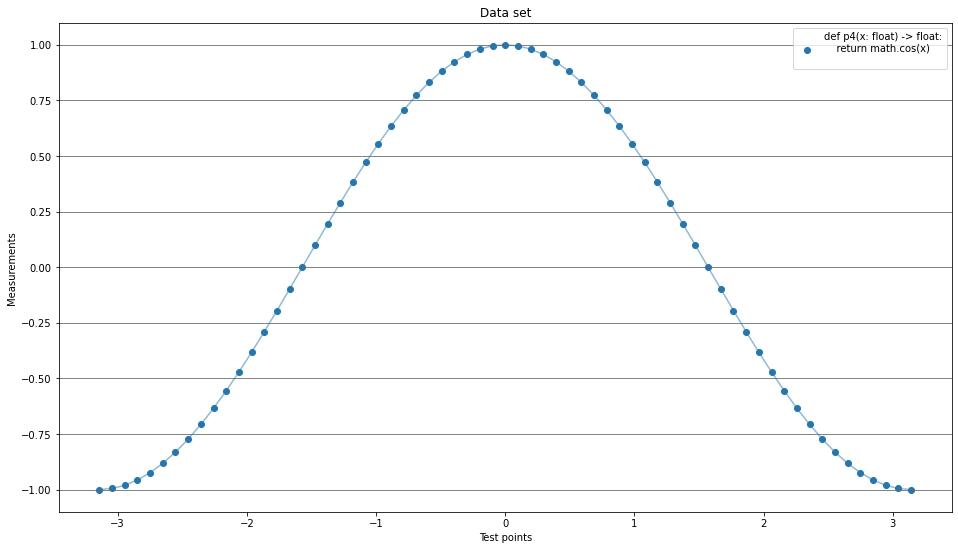

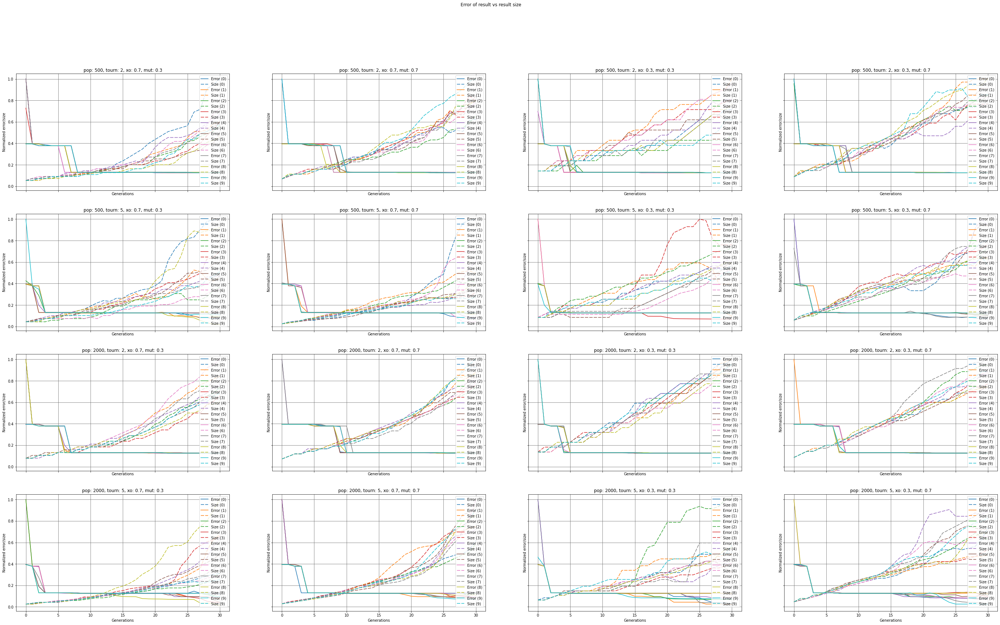

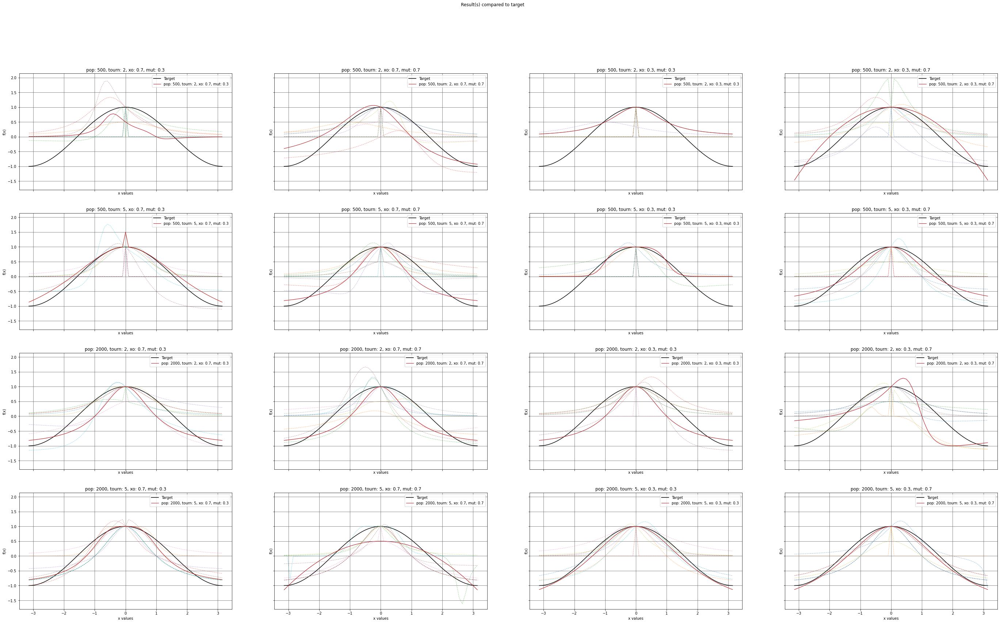

In [25]:

# attempting to reverse-engineer the cosine function.
def p4(x: float) -> float:
    return math.cos(x)

pset4 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_4"),1)
pset4.addPrimitive(operator.add, 2)
pset4.addPrimitive(operator.sub, 2)
pset4.addPrimitive(operator.mul, 2)
pset4.addPrimitive(protectedDiv, 2)
pset4.addPrimitive(operator.neg, 1)

# numerical constants +-1
pset4.addTerminal(1)
pset4.addTerminal(-1)
# also allowing the GP to use randomness
pset4.addEphemeralConstant(appendUniqueNameSuffix("rand101_4"), rand101)
pset4.renameArguments(ARG0='x')

#theFourthTest
theFourthTest: ParameterTester = ParameterTester(p4, primSet = pset4)



theFourthTest.runTheTests()



theFourthTest.showResults()

In [26]:
theFourthTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 0.34421720858492577
	2000 : 0.10133915762664716
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 0.12869395427883892
	2000 : 0.10133915762664716
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 0.3708697762937086
	2000 : 0.10133915762664716
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 0.0752914699096384
	2000 : 0.2490654013293441
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 0.029875244386078657
	2000 : 0.029543448534793043
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 0.10133915762664716
	2000 : 0.07541078034337974
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 0.2652625410071718
	2000 : 0.009480830660039286
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 0.04191317859130656
	2000 : 0.009480830660039283

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 0.34421720858492577
	 5 : 0.029875244386078657
pop 500  xo: 0.7  mut: 0.7:
	 2 : 0.12869395427883892
	 5 : 0.10133915762664716
pop 500  xo: 0.3  mut: 0.3:
	 2 : 0.3708697762937086
	

In [27]:
theFourthTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 1.5354368170440793
	Uncertainty: 0.16855313902109428
This is not a significant difference. (<95%)

The best tournament size is 5
	Difference: 3.008788549355364
	Uncertainty: 0.019695833518264226
This is a significant difference. (95%<=sig<=99%)

The best crossover rate is 0.7
	Difference: -0.6828131201808999
	Uncertainty: 0.5166780825815759
This is not a significant difference. (<95%)

The best mutation rate is 0.7
	Difference: 1.0202981316782838
	Uncertainty: 0.3415479223741594
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 2.454925881347747
	Uncertainty: 0.01865562446312039
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.227237855003641
	Uncertainty: 0.031773755045230515
This is a significant difference. (95%<=sig<=99%)

The best crossover rate

Just like the first and third tests, the only significant improvement in GA performance was with a tournament size of 5, with the improvement it gave having a significance of ~98%, whilst all the difference for all the other parameters was completely insignificant.

Once again, the overall stats indicate that a tournament size of 5 is significantly better than a tournament size of 2, and that a population size of 2000 is even more significantly better than a tournament size of 500, whilst the other hyper-parameters were still ultimately insignificant.

The graphs present a variety of shapes, some of which are more accurate than others. Some particularly interesting shapes noted in there are the lines from the not-best iterations which deviate significantly above/below the target, before suddenly spiking up/down to meet the line at x=0; made even more interesting by the best line from the configuration with `population 500 tournament size 5 crosssover 0.3 mutation rate 0.3`, which follows the target line somewhat closely before suddenly spiking above and away from it around x=0. However, that was the configuration that took the fewest total evaluations to run, so it could be seen as a case of 'you get what you pay for' computationally.

In [28]:
if memorySaving:
    del theFourthTest

    del pset4

# Test 6: Ripple Benchmark


Testing: 
def p5(x: float) -> float:
    return ((x-3)*(x-3)) + (2*math.sin((x-4)*(x-4)))



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12348 evaluations.
	 sub(1, sub(x, sub(add(add(neg(x), sub(sub(mul(-1, add(add(sub(sub(1, 1), 1), add(1, add(-1, x))), x)), sub(neg(1), add(1, 1))), mul(1, -1))), sub(sub(mul(-1, add(add(add(sin(-1), -1), add(-1, add(-1, x))), x)), neg(add(0, sub(mul(x, x), 1)))), mul(1, -1))), sin(add(neg(x), -1)))))
	 3.277102788663205
Starting iteration 1
Iteration 1 done, 12326 evaluations.
	 mul(sub(sub(1, -1), add(add(sin(0), -1), x)), neg(add(add(x, -1), mul(neg(1), neg(add(add(add(1, sub(mul(add(neg(x), x), sub(1, sub(1, add(neg(mul(add(x, 1), sin(sin(x)))), add(-1, x))))), 1)), -1), -1))))))
	 2.070870318353002
Starting iteration 2
Iteration 2 done, 12419 evaluations.
	 sub(mul(add(add(x, -1), neg(sub(1, -1))), add(add(x, neg(sub(1, -1))), -1)), add(mul(0, -1), mul(0, 1)))
	 2.070870318353002
Starting iteration 3
Iteration 3 done, 12290 evaluations.
	 sub(sub(mul(x, x), sub(sub(add(add(add(mul(neg(sub(1, 1)), -

Iteration 4 done, 8146 evaluations.
	 mul(add(mul(x, 1), add(-1, sin(-1))), sub(add(x, add(neg(sub(1, -1)), -1)), neg(-1)))
	 5.137977349722752
Starting iteration 5
Iteration 5 done, 8043 evaluations.
	 mul(sub(sub(sub(-1, 1), sub(sub(-1, x), mul(1, -1))), 1), add(sub(-1, 1), add(x, -1)))
	 2.070870318353002
Starting iteration 6
Iteration 6 done, 8072 evaluations.
	 sub(add(sub(neg(x), sin(mul(mul(1, -1), sin(-1)))), 1), add(sub(sub(add(add(neg(1), mul(1, 0)), add(sub(mul(add(x, add(x, add(sin(-1), -1))), neg(-1)), sub(mul(x, add(-1, x)), x)), sub(x, sub(1, add(add(-1, x), -1))))), add(1, sin(-1))), sub(1, x)), sub(sub(-1, 1), add(add(x, sub(x, sub(sub(x, x), -1))), 1))))
	 2.0645745302870475
Starting iteration 7
Iteration 7 done, 8147 evaluations.
	 mul(sub(add(add(-1, x), sub(neg(0), neg(-1))), sub(0, -1)), sub(add(sub(sin(-1), 1), x), neg(-1)))
	 2.370449747520689
Starting iteration 8
Iteration 8 done, 8023 evaluations.
	 mul(add(sub(add(-1, sub(1, sub(1, x))), 1), -1), add(add(sub(

Iteration 3 done, 14145 evaluations.
	 sub(add(mul(add(add(sin(sub(-1, add(add(-1, 1), sub(-1, -1)))), -1), x), sub(sub(add(-1, 0), 1), sub(1, x))), sin(neg(mul(-1, -1)))), sub(add(add(add(add(sub(sin(sub(-1, sin(sin(x)))), sin(1)), -1), sin(x)), add(mul(0, 1), add(x, add(-1, neg(-1))))), -1), add(1, sin(0))))
	 1.9360463438118616
Starting iteration 4
Iteration 4 done, 14096 evaluations.
	 sub(sub(sub(mul(sub(-1, add(neg(add(-1, x)), add(1, add(-1, 1)))), x), add(mul(x, -1), sub(-1, sub(x, sub(sub(add(1, 0), add(neg(add(add(-1, 0), x)), add(1, sin(sub(sub(-1, add(add(neg(x), add(sub(sub(-1, x), neg(1)), -1)), add(1, sub(x, add(-1, x))))), add(1, add(neg(x), sub(sin(neg(1)), add(-1, x))))))))), add(mul(x, mul(-1, 1)), sub(mul(0, add(mul(sub(x, 1), -1), mul(sub(x, add(add(1, add(-1, sub(sin(x), add(mul(sub(x, 1), -1), x)))), sub(0, sub(x, sub(sub(add(1, 0), add(neg(add(-1, x)), add(1, sin(1)))), add(mul(sub(1, 1), add(sin(0), add(1, x))), sub(1, x))))))), mul(0, x)))), x))))))), x), sub(

Iteration 8 done, 12256 evaluations.
	 sub(mul(sub(sub(x, 1), neg(add(add(add(-1, -1), -1), mul(1, 0)))), sub(x, add(1, 1))), add(neg(1), neg(sub(neg(-1), mul(-1, sin(-1))))))
	 2.051752228565903
Starting iteration 9
Iteration 9 done, 12435 evaluations.
	 mul(sub(mul(-1, sin(neg(sub(1, sub(x, sin(x)))))), add(add(sub(neg(1), sin(1)), mul(sub(x, 1), sub(1, sub(x, 1)))), sin(x))), mul(mul(sin(1), add(1, 1)), 1))
	 3.0590104285173836
done
add(1, sub(sub(neg(0), sub(sub(neg(sub(mul(sub(sub(x, 1), mul(add(1, 1), 1)), sub(x, sub(sin(sin(1)), -1))), mul(mul(1, 1), neg(add(sin(add(sin(1), mul(x, x))), sin(sub(-1, x))))))), 1), 1)), sub(x, 1)))
1.8738429341267187
plotted
x2, y0
pop: 2000, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 49335 evaluations.
	 mul(neg(add(1, sub(1, add(x, -1)))), add(-1, add(-1, add(x, -1))))
	 2.070870318353002
Starting iteration 1
Iteration 1 done, 49457 evaluations.
	 mul(add(neg(add(1, 1)), sub(x, 1)), add(sub(sub(-1, 1), 0), add(-1, x)))
	 2

Iteration 9 done, 32765 evaluations.
	 sub(mul(add(add(neg(sin(1)), add(mul(-1, sub(1, x)), mul(-1, x))), add(add(-1, -1), add(-1, x))), add(-1, add(x, sin(-1)))), add(sin(x), neg(x)))
	 2.0380462879531986
done
sub(mul(add(add(neg(sin(1)), add(mul(-1, sub(1, x)), mul(-1, x))), add(add(-1, -1), add(-1, x))), add(-1, add(x, sin(-1)))), add(sin(x), neg(x)))
2.0380462879531986
plotted
x2, y3
pop: 2000, tourn: 2, xo: 0.3, mut: 0.7
Starting iteration 0
Iteration 0 done, 49465 evaluations.
	 mul(add(add(sub(0, 1), add(-1, neg(neg(x)))), -1), add(sin(-1), sub(add(-1, x), mul(1, 1))))
	 2.370449747520689
Starting iteration 1
Iteration 1 done, 49348 evaluations.
	 sub(add(add(sub(sub(sub(neg(-1), x), mul(sin(-1), add(add(1, 1), neg(-1)))), x), add(sub(sub(sub(neg(-1), x), mul(sin(-1), sin(1))), x), sub(mul(neg(x), sub(1, x)), -1))), neg(-1)), sub(add(mul(x, 1), -1), 1))
	 2.0600272866990315
Starting iteration 2
Iteration 2 done, 49437 evaluations.
	 add(add(sin(add(1, sin(neg(neg(mul(neg(1), neg

Iteration 3 done, 56514 evaluations.
	 add(add(sin(sin(sub(add(add(add(1, 1), add(sub(x, sub(1, 0)), add(add(0, sub(0, -1)), mul(add(sub(sin(mul(sin(1), add(-1, -1))), 1), add(-1, x)), mul(sub(neg(1), sub(1, mul(x, 1))), sub(neg(1), 1)))))), add(neg(sin(sub(-1, 1))), mul(x, 1))), 1))), 1), mul(add(sub(add(-1, -1), 1), add(-1, x)), mul(sub(neg(1), sub(1, x)), sub(neg(1), add(add(-1, add(add(add(-1, x), add(neg(sub(x, -1)), sub(mul(add(add(1, 1), add(sub(x, sub(1, sub(-1, x))), add(add(0, -1), x))), mul(0, 1)), add(sub(x, x), mul(1, -1))))), 1)), -1)))))
	 1.8085838726205903
Starting iteration 4
Iteration 4 done, 56602 evaluations.
	 sub(sin(1), add(sub(1, sin(1)), add(sub(add(add(x, mul(neg(sub(x, add(1, 1))), sub(x, add(1, 1)))), sin(mul(-1, neg(add(add(-1, mul(1, 0)), sub(add(sub(mul(add(-1, neg(add(-1, x))), sub(-1, 1)), sin(mul(sin(mul(-1, 1)), add(add(-1, -1), neg(add(-1, 1)))))), add(sub(add(add(x, mul(neg(sub(sub(mul(x, 1), 1), add(1, 1))), sub(x, add(1, 1)))), mul(1, -1)), 1), a

Iteration 3 done, 49312 evaluations.
	 mul(add(sub(1, sin(1)), add(add(1, neg(-1)), sub(neg(sin(-1)), x))), sub(neg(sub(-1, 1)), add(x, neg(mul(-1, neg(1))))))
	 2.070870318353001
Starting iteration 4
Iteration 4 done, 49504 evaluations.
	 sub(mul(add(-1, mul(sub(x, add(1, 1)), neg(-1))), add(x, add(add(-1, -1), sin(-1)))), sub(add(sin(sin(-1)), mul(-1, -1)), sin(1)))
	 1.9928273639043534
Starting iteration 5
Iteration 5 done, 49192 evaluations.
	 mul(add(add(sub(-1, mul(sin(1), mul(-1, 0))), x), add(-1, mul(1, sin(mul(sin(sin(mul(1, -1))), add(1, 1)))))), add(-1, add(sub(-1, 1), x)))
	 2.0707575369143822
Starting iteration 6
Iteration 6 done, 49624 evaluations.
	 sub(add(neg(-1), sin(add(mul(-1, -1), sub(sin(mul(add(add(mul(mul(-1, add(0, 1)), neg(sub(sin(1), neg(-1)))), add(-1, sub(sub(x, mul(0, 1)), add(1, 1)))), -1), mul(x, sub(sub(x, -1), mul(0, 0))))), add(sub(1, -1), neg(-1)))))), mul(add(add(x, -1), add(-1, -1)), neg(add(sub(add(x, -1), neg(-1)), -1))))
	 1.7010657272546195
Sta

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


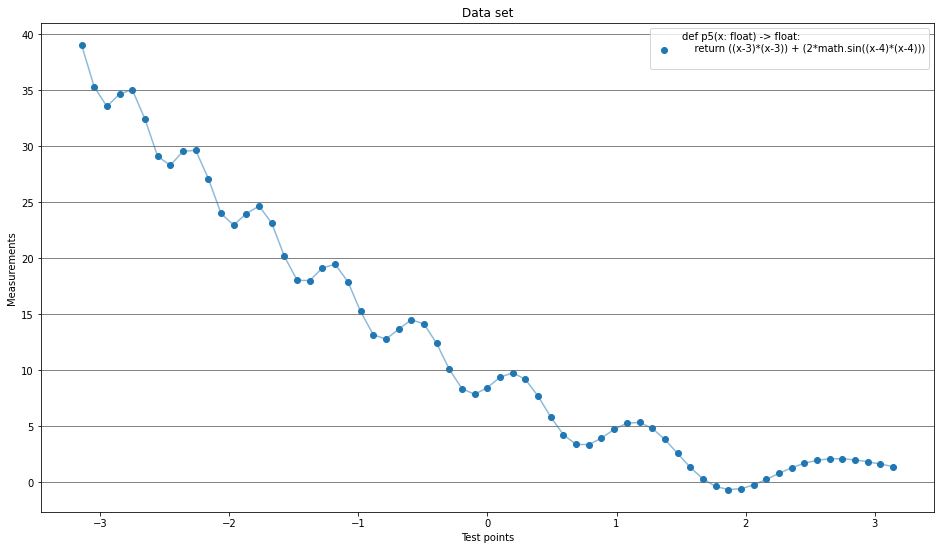

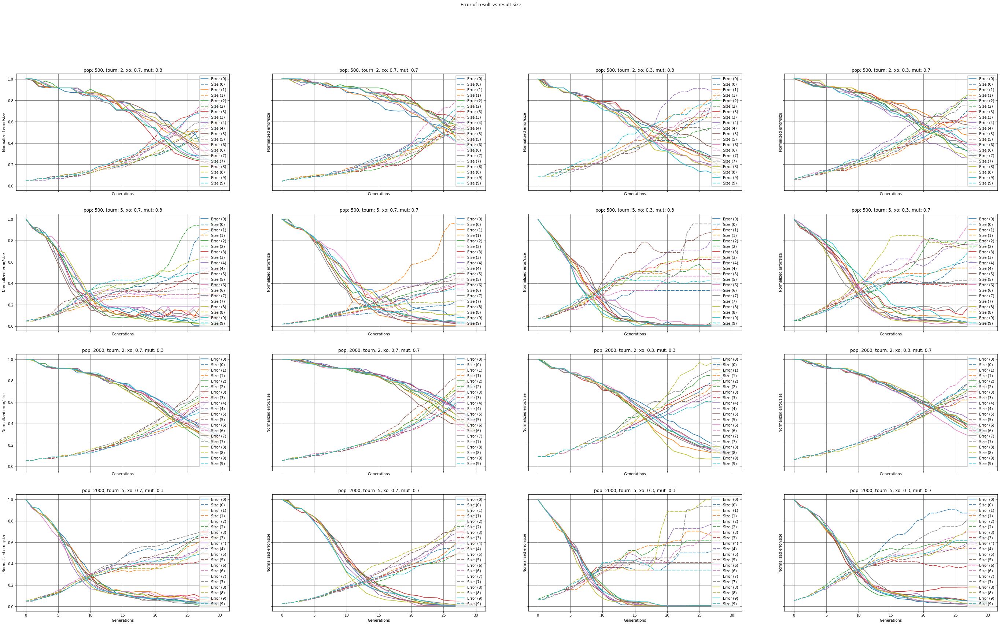

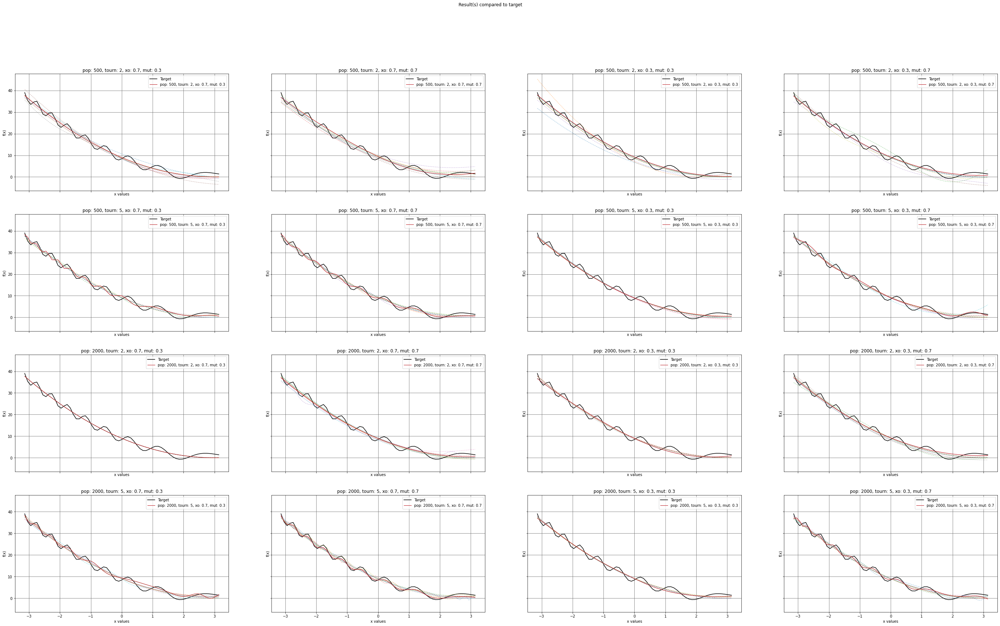

In [29]:
# basically the ripple benchmark from https://deap.readthedocs.io/en/master/api/benchmarks.html#module-deap.benchmarks.gp
def p5(x: float) -> float:
    return ((x-3)*(x-3)) + (2*math.sin((x-4)*(x-4)))

pset5 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_5"),1)
pset5.addPrimitive(operator.add, 2)
pset5.addPrimitive(operator.sub, 2)
pset5.addPrimitive(operator.mul, 2)
pset5.addPrimitive(operator.neg, 1)
pset5.addPrimitive(math.sin, 1)
# numerical constants +-1
pset5.addTerminal(1)
pset5.addTerminal(-1)
# also allowing the GP to use randomness
#self.pset.addEphemeralConstant("rand101", lambda: random.randint(-1,1))
pset5.addEphemeralConstant(appendUniqueNameSuffix("rand101_5"), rand101)
#self.pset.addEphemeralConstant(ephemeral = rand101)
pset5.renameArguments(ARG0='x')

theFifthTest: ParameterTester = ParameterTester(p5, primSet = pset5)

#theFifthTest

theFifthTest.runTheTests()



theFifthTest.showResults()

In [30]:
theFifthTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 2.070870318353002
	2000 : 2.070870318353
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 2.0356727158948082
	2000 : 2.03164252870897
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 2.0645745302870475
	2000 : 2.0380462879531986
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 1.9966360493979476
	2000 : 2.048342268047477
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 1.784577158641921
	2000 : 1.8631317855981564
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 1.6469973319793538
	2000 : 0.6625453371425987
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 2.0115180942660555
	2000 : 1.9293586930439826
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 1.8738429341267187
	2000 : 1.2977117541617662

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 2.070870318353002
	 5 : 1.784577158641921
pop 500  xo: 0.7  mut: 0.7:
	 2 : 2.0356727158948082
	 5 : 1.6469973319793538
pop 500  xo: 0.3  mut: 0.3:
	 2 : 2.0645745302870475
	 5 : 2.0115180942660555
pop 500 

In [31]:
theFifthTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 2000
	Difference: 1.4293251678945706
	Uncertainty: 0.1959822621303983
This is not a significant difference. (<95%)

The best tournament size is 5
	Difference: 2.604872274448088
	Uncertainty: 0.035174822470841645
This is a significant difference. (95%<=sig<=99%)

The best crossover rate is 0.7
	Difference: -1.6953393608808789
	Uncertainty: 0.13383239115890563
This is not a significant difference. (<95%)

The best mutation rate is 0.7
	Difference: 1.8671742708581776
	Uncertainty: 0.10410898091708101
This is not a significant difference. (<95%)

Stats for all runs so far


The best population size is 2000
	Difference: 2.4293308997848957
	Uncertainty: 0.019002977276693627
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.2092418704649415
	Uncertainty: 0.03206755546894427
This is a significant difference. (95%<=sig<=99%)

The best crossover r

Just like tests 1, 3, and 5, tournament size was the only hyper-parameter with any significant impact on the results for this test.

Unfortunately, the vast majority of hyper-parameter configurations still lead to the fittest result being a mere approximation of the target points, making a smooth curve from the starting point to the end, instead of following the 'ripples' in-between. Despite this, some of the configurations did still appear to make a token effort at following these ripples; with all of these partially-rippled results coming from configurations with a tournament size of 5.

One thing of note was the configuration `pop: 2000, tourn: 2, xo: 0.7, mut: 0.3`: All 10 iterations for it produced different equations, yet 8 of those iterations produced a best result with an error of 2.070870318353 to 13 significant figures. This could have been because of a low mutation rate causing convergence, however, this doesn't appear to have happened anywhere else in the tests. Additionally, as this had a population of 2000, you would expect to see a wider range of results in the initial population, leading to much less chance of convergence happening. Therefore, it is unclear how this did happen, but it somehow did.

In [32]:
if memorySaving:
    del theFifthTest

    del pset5

# Test 7: p(x) = x

This final test is to see whether or not the GP can reverse-engineer the simple function of p(x) = x, even when it does have a primitive set containing the tools to produce a lot of other expressions.

This isn't intended as a serious test, more as a one-off test to see if the GA can handle stupid problems being thrown at it. I don't expect any sort of important results to come from the statistical tests, therefore, the fitnesses for these tests won't be added to the ongoing totals for fitnesses. However, if this test does result in a noticable difference for the parameter configurations for this run, I shall re-run it, adding the outcomes to the total.


Testing: 
def p6(x: float) -> float:
    return x



<ipython-input-8-3a68b3527293>:115: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.targetFig.show()


x0, y0
pop: 500, tourn: 2, xo: 0.7, mut: 0.3
Starting iteration 0
Iteration 0 done, 12335 evaluations.
	 protectedDiv(x, neg(-1))
	 0.0
Starting iteration 1
Iteration 1 done, 12396 evaluations.
	 mul(mul(-1, -1), x)
	 0.0
Starting iteration 2
Iteration 2 done, 12413 evaluations.
	 mul(x, 1)
	 0.0
Starting iteration 3
Iteration 3 done, 12341 evaluations.
	 protectedDiv(x, 1)
	 0.0
Starting iteration 4
Iteration 4 done, 12380 evaluations.
	 neg(protectedDiv(x, -1))
	 0.0
Starting iteration 5
Iteration 5 done, 12427 evaluations.
	 mul(x, 1)
	 0.0
Starting iteration 6
Iteration 6 done, 12471 evaluations.
	 protectedDiv(protectedDiv(x, -1), -1)
	 0.0
Starting iteration 7
Iteration 7 done, 12352 evaluations.
	 add(x, 0)
	 0.0
Starting iteration 8
Iteration 8 done, 12263 evaluations.
	 mul(1, x)
	 0.0
Starting iteration 9
Iteration 9 done, 12418 evaluations.
	 add(0, x)
	 0.0
done
protectedDiv(x, neg(-1))
0.0
plotted
x0, y1
pop: 500, tourn: 2, xo: 0.7, mut: 0.7
Starting iteration 0
Iteration 

Iteration 1 done, 56669 evaluations.
	 neg(neg(x))
	 0.0
Starting iteration 2
Iteration 2 done, 56653 evaluations.
	 mul(1, x)
	 0.0
Starting iteration 3
Iteration 3 done, 56502 evaluations.
	 protectedDiv(x, 1)
	 0.0
Starting iteration 4
Iteration 4 done, 56514 evaluations.
	 neg(neg(x))
	 0.0
Starting iteration 5
Iteration 5 done, 56610 evaluations.
	 protectedDiv(x, 1)
	 0.0
Starting iteration 6
Iteration 6 done, 56559 evaluations.
	 neg(mul(x, -1))
	 0.0
Starting iteration 7
Iteration 7 done, 56521 evaluations.
	 protectedDiv(x, 1)
	 0.0
Starting iteration 8
Iteration 8 done, 56545 evaluations.
	 add(x, 0)
	 0.0
Starting iteration 9
Iteration 9 done, 56551 evaluations.
	 mul(x, 1)
	 0.0
done
sub(x, 0)
0.0
plotted
x2, y2
pop: 2000, tourn: 2, xo: 0.3, mut: 0.3
Starting iteration 0
Iteration 0 done, 32768 evaluations.
	 neg(neg(x))
	 0.0
Starting iteration 1
Iteration 1 done, 32653 evaluations.
	 add(x, 0)
	 0.0
Starting iteration 2
Iteration 2 done, 32728 evaluations.
	 mul(mul(x, 1)

<ipython-input-8-3a68b3527293>:221: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.fitSizeFig.show()
<ipython-input-8-3a68b3527293>:223: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  self.resTargetFig.show()


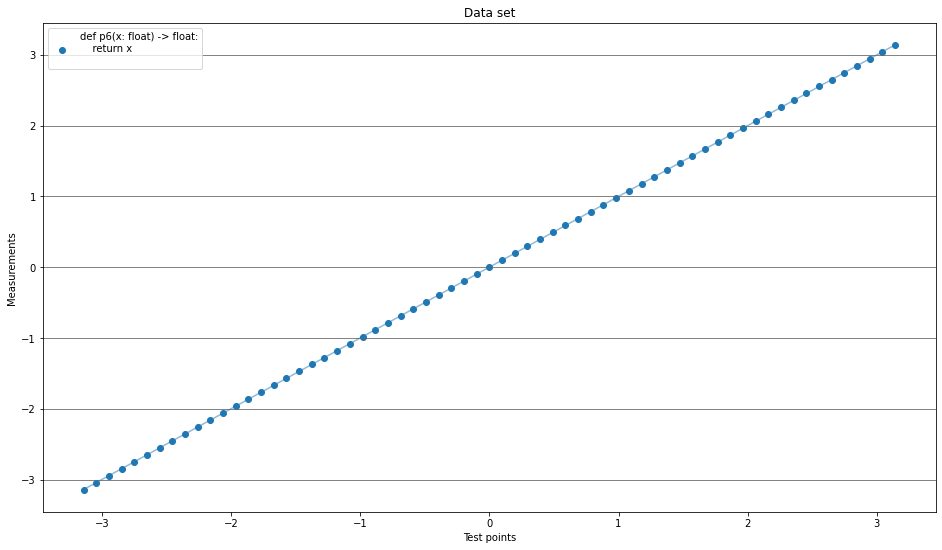

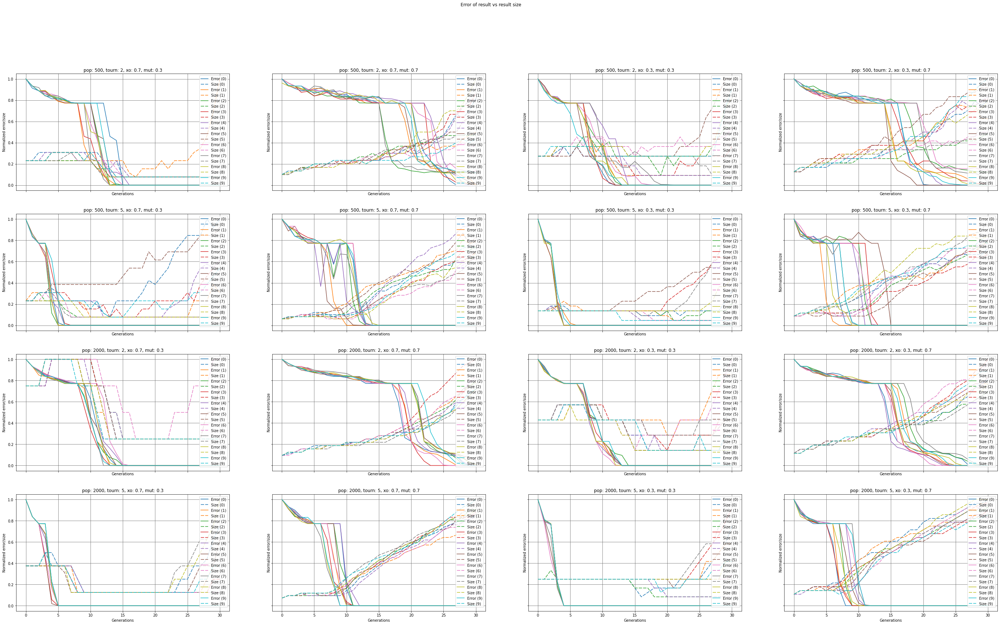

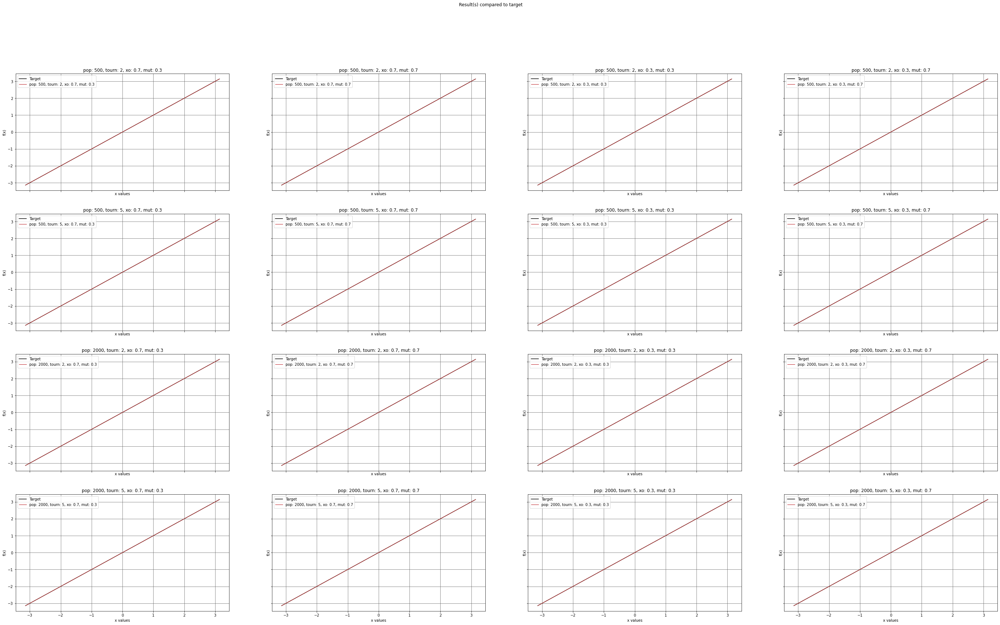

In [33]:


# yep we're giving the GP a stupid problem to screw around with it.
def p6(x: float) -> float:
    return x

pset6 = gp.PrimitiveSet(appendUniqueNameSuffix("MAIN_6"),1)
pset6.addPrimitive(operator.add, 2)
pset6.addPrimitive(operator.sub, 2)
pset6.addPrimitive(operator.mul, 2)
pset6.addPrimitive(protectedDiv, 2)
pset6.addPrimitive(operator.neg, 1)
pset6.addPrimitive(math.sin, 1)
pset6.addPrimitive(math.cos, 1)
# numerical constants +-1
pset6.addTerminal(1)
pset6.addTerminal(-1)
pset6.addTerminal(math.pi)
pset6.addTerminal(math.e)
# also allowing the GP to use randomness
#self.pset.addEphemeralConstant("rand101", lambda: random.randint(-1,1))
pset6.addEphemeralConstant(appendUniqueNameSuffix("rand101_6"), rand101)
#self.pset.addEphemeralConstant(ephemeral = rand101)
pset6.renameArguments(ARG0='x')


# yep, this is a stupid test. so we're going to avoid polluting the overall results with this act of stupidity.
stupidityAlert = True


theSixthTest: ParameterTester = ParameterTester(p6, primSet = pset6)

theSixthTest.runTheTests()

theSixthTest.showResults()


In [34]:
theSixthTest.statPrinter()

Stats for this run

Best fitnesses with each parameter config

tourn 2  xo: 0.7  mut: 0.3:
	 500 : 0.0
	2000 : 0.0
tourn 2  xo: 0.7  mut: 0.7:
	 500 : 0.0
	2000 : 0.0
tourn 2  xo: 0.3  mut: 0.3:
	 500 : 0.0
	2000 : 0.0
tourn 2  xo: 0.3  mut: 0.7:
	 500 : 0.0
	2000 : 0.0
tourn 5  xo: 0.7  mut: 0.3:
	 500 : 0.0
	2000 : 0.0
tourn 5  xo: 0.7  mut: 0.7:
	 500 : 0.0
	2000 : 0.0
tourn 5  xo: 0.3  mut: 0.3:
	 500 : 0.0
	2000 : 0.0
tourn 5  xo: 0.3  mut: 0.7:
	 500 : 0.0
	2000 : 0.0

tournament fitnesses with each parameter config

pop 500  xo: 0.7  mut: 0.3:
	 2 : 0.0
	 5 : 0.0
pop 500  xo: 0.7  mut: 0.7:
	 2 : 0.0
	 5 : 0.0
pop 500  xo: 0.3  mut: 0.3:
	 2 : 0.0
	 5 : 0.0
pop 500  xo: 0.3  mut: 0.7:
	 2 : 0.0
	 5 : 0.0
pop 2000 xo: 0.7  mut: 0.3:
	 2 : 0.0
	 5 : 0.0
pop 2000 xo: 0.7  mut: 0.7:
	 2 : 0.0
	 5 : 0.0
pop 2000 xo: 0.3  mut: 0.3:
	 2 : 0.0
	 5 : 0.0
pop 2000 xo: 0.3  mut: 0.7:
	 2 : 0.0
	 5 : 0.0

crossover fitnesses with each parameter config

pop 500  tourn 2  mut: 0.3:
	 0.7 : 0.

In [35]:
theSixthTest.statTester()

T-test for all the paired parameter config results.

Tests for this measure

The best population size is 500
	Difference: nan
	Uncertainty: nan
This is a very significant difference. >99%

The best tournament size is 2
	Difference: nan
	Uncertainty: nan
This is a very significant difference. >99%

The best crossover rate is 0.7
	Difference: nan
	Uncertainty: nan
This is a very significant difference. >99%

The best mutation rate is 0.3
	Difference: nan
	Uncertainty: nan
This is a very significant difference. >99%

Stats for all runs so far


The best population size is 2000
	Difference: 2.4293308997848957
	Uncertainty: 0.019002977276693627
This is a significant difference. (95%<=sig<=99%)

The best tournament size is 5
	Difference: 2.2092418704649415
	Uncertainty: 0.03206755546894427
This is a significant difference. (95%<=sig<=99%)

The best crossover rate is 0.7
	Difference: -0.7211103614283263
	Uncertainty: 0.4744135041601194
This is not a significant difference. (<95%)

The best mu

To nobody's surprise, every single iteration of this produced a version of `f(x) = x`, with an error rate of 0.

This also meant that the statistical tests automatically run for this iteration failed, because there was no difference to find and evaluate the significance of. Therefore, I shall not be re-running this test with `stupidityAlert` disabled, as it would not provide any useful information for the overall statistics for all tests.
 
No iterations for any configurations were able to return `f(x) = x` directly, instead, all of them had to put `x` through at least one operator. I was unable to find anything in the DEAP documentation to explicitly confirm or deny this, however, there may be a requirement within DEAP for all tree-based individuals to hold at least one non-terminal operator within them when the primitive set contains terminals and non-terminals, leading to these somewhat convoluted methods of returning `x`.

In [36]:
if memorySaving:
    del theSixthTest

    del pset6


# Conclusions (The full report within 500 words)

From the stats, it appears that population size and tournament size have very significant impacts on GA performance, whilst crossover rates and mutation rates have a very insignificant impact.

The best population size is 2000, not 500, with a population of 2000 reducing error rates by 2.4293308997848957 compared to a population size of 500, with a significance of 98.0997022723%. This may be because the larger population allows a larger search space to be explored (due to more individuals existing), thereby reducing the likelihood of the GP getting caught in a local maximum/minimum. 

The best tournament size is 5, not 2, with a tournament size of 5 reducing error rates by 2.2092418704649415 compared to a tournament size of 2, with a significance of 96.7932444531%. This is probably due to the larger tournament size making it more likely that a good result from a list will be picked, as fewer weaker individuals are able to get picked.

The insignificance for crossover/mutation may be due to the inherent randomness of crossover and mutation. In short, just because a particular reproduction strategy chance is used, that doesn't necessarily mean that the reproduction strategy will be used. Additionally, the usage of the reproduction strategy doesn't have any bearing on success, as they both have some element of randomness. Crossover does not guarantee that suitable parents and suitable sub-trees from those parents will be used, and mutation does not guarantee that an appropriate new sub-tree will be generated at a suitable position in the muted individual. Therefore, because of this lack of inherent advantange for these reproduction strategy usage chances, the differences in the fitnesses from configurations with differences in these hyper-parameters is likely to be insignificant.

Therefore, the best configuration to use is:

* Population of 2000
    * **Statistically significant**
        * uncertainty of 0.019002977276693627
* Tournament size of 5
    * **Statistically significant**
        * uncertainty of 0.03206755546894427
* Crossover rate of ~~0.7~~
    * **Statistically insignificant**
        * uncertainty of 0.4744135041601194
* Mutation rate of ~~0.7~~
    * **Statistically insignificant**
        * uncertainty of 0.9468722838494585



Unfortunately, I will admit that there are still some problems with this conclusion.

For example, this conclusion was found out from running the *Dependent t-test for paired samples* on only the fitness of the __best__ result from the 10 iterations for each configuration, meaning that, if one 'best' result was anomalously good (such as the best overall result from test 4), that would skew the results considerably.

I should have used the fitnesses from the results of all 10 iterations for each config for each function instead, so, if any such anomalies did happen, their could have be balanced out by the non-anomalous majority of results.

Additionally, I did not consider the size of the individuals produced by the GP as well, meaning that the optimal configuration identified may produce bloated, inefficient, results. I also didn't properly look at the total number of evaluations used to produce each of the individuals, therefore, I might have selected an incredibly inefficient configuration as the best one.

However, the stats do indicate that this configuration should be, at very least, 'good enough'.